# Projet 6 : Classifiez automatiquement des biens de consommation

# Salma CHAFAI

## Bibliothèques utilisées 

### Bibliothèques usuelles et bibliothèques de visualisation 

In [1]:
 # ça nous permet d'importer numpy avec son nom np et matplotlib.pyplot as plt
%pylab inline 

# data
from pandarallel import pandarallel
from collections import Counter
import pandas as pd
import scipy
import re

# visualisation
import seaborn as sns
import missingno as msn
from wordcloud import WordCloud
from PIL import Image
from sklearn.manifold import TSNE


sns.set()

# Librairie plotly pour les graphiques intéractives
import plotly.graph_objects as go
import plotly as plo
import plotly.express as px
from plotly.offline import download_plotlyjs, init_notebook_mode,iplot
from plotly.subplots import make_subplots

Populating the interactive namespace from numpy and matplotlib


###  Bibliothèques de ML

In [2]:
# Méthodes de clustering
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

# Méthodes de réduction de dimensions
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA, LatentDirichletAllocation

# Encodage
from sklearn.preprocessing import LabelEncoder 

# Preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn import manifold, decomposition
# Métriques
from sklearn.metrics import silhouette_score, adjusted_rand_score

In [3]:
from pickle import dump
import pickle

### NLP

In [4]:
# NLTK
import nltk
from nltk import ngrams
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk import pos_tag
from nltk.tokenize import word_tokenize, wordpunct_tokenize, RegexpTokenizer
from nltk.corpus import words
from nltk.corpus import stopwords
import string
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

In [5]:
# download 

"""
nltk.download('omw-1.4')
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('words')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
"""

"\nnltk.download('omw-1.4')\nnltk.download('wordnet')\nnltk.download('stopwords')\nnltk.download('words')\nnltk.download('punkt')\nnltk.download('averaged_perceptron_tagger')\n"

### Deep Learning

In [6]:
import tensorflow as tf
import keras
from keras.models import Sequential
from keras.preprocessing import sequence
from keras.layers import Embedding, Flatten, Dense



import tensorflow.keras
from tensorflow.keras import backend as K

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
import gensim

# Bert
import os
import transformers
#from transformers import *

os.environ["TF_KERAS"]='1'

In [7]:
print(tf.__version__)
print(keras.__version__)
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
print(tf.test.is_built_with_cuda())

2.9.1
2.9.0
Num GPUs Available:  0
False


### Image

In [8]:
import cv2
from matplotlib.image import imread

### CNN Transfer Learning

In [9]:
from keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing import image
from keras.layers import Dense
from keras import Model

## I- Partie Texte

## A) Jeu de données et exploration

### 1- Exploration du jeu de données

In [10]:
# Importation du jeu de données
df = pd.read_csv("C:/Users/salma/OneDrive/Bureau/Projet 6/Data/Flipkart/flipkart_com-ecommerce_sample_1050.csv")
df.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."


In [11]:
# Taille du jeu de données
df.shape

(1050, 15)

In [12]:
# Information sur les colonnes du jeu de données
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_specifications  

Explication des variables :

 - **uniq_id** : l'id du produit 
 - **crawl_timestamp** : horodatage d'exploration
 - **product_url** : l'url du produit
 - **product_name** : nom du produit
 - **product_category_tree** : arborescence de catégories de produits
 - **pid** : ? (ça ressemble à un code barre)
 - **retail_price** : prix en détails
 - **discounted_price** : prix réduit
 - **image** : image du produit 
 - **is_FK_Advantage_product** : ? (booléen True ou false)
 - **description** : description du produit
 - **product_rating** : évaluation du produit
 - **overall_rating** : note globale
 - **brand** :  la marque du produit
 - **product_specifications** : Spécifications du produit

In [13]:
# Les valeurs manquantes
df.isna().sum().sort_values(ascending = False)

brand                      338
retail_price                 1
discounted_price             1
product_specifications       1
uniq_id                      0
crawl_timestamp              0
product_url                  0
product_name                 0
product_category_tree        0
pid                          0
image                        0
is_FK_Advantage_product      0
description                  0
product_rating               0
overall_rating               0
dtype: int64

On a la variable 'brand' (la marque des produits) a 338 de valeurs aberrantes et les variables 'product_specifications', 'retail_price' ( et 'discounted_price' ont une seule valeur manquante.

In [14]:
# On affiche les doublons de chaque colonne du dataset
for col in df.columns :
    n = df.duplicated(subset=col).sum()
    print(f"col:{col} -> duplicated : {n}")

col:uniq_id -> duplicated : 0
col:crawl_timestamp -> duplicated : 901
col:product_url -> duplicated : 0
col:product_name -> duplicated : 0
col:product_category_tree -> duplicated : 408
col:pid -> duplicated : 0
col:retail_price -> duplicated : 695
col:discounted_price -> duplicated : 625
col:image -> duplicated : 0
col:is_FK_Advantage_product -> duplicated : 1048
col:description -> duplicated : 0
col:product_rating -> duplicated : 1023
col:overall_rating -> duplicated : 1023
col:brand -> duplicated : 559
col:product_specifications -> duplicated : 65


In [15]:
# Les catégories du produit
fig = px.histogram(data_frame=df, x='product_category_tree').update_xaxes(categoryorder = 'total descending')
fig.show()

On remarque qu'on a beaucoup de catégories, on va les regrouper par la suite en gardant que l

In [16]:
def renommage_categories(col):
    categories_f = []
    for elem in col :
        res = re.findall('[A-Za-z- &]+', elem.split(' >>')[0])
        #print('Résultat : ', res)
        categories_f.append(res[0])
        
    return categories_f

In [17]:
col = df["product_category_tree"].tolist()
nouvelles_categories = renommage_categories(col)
df['label_names'] = nouvelles_categories

In [18]:
fig = px.histogram(data_frame=df, x='label_names').update_xaxes(categoryorder = 'total descending')
fig.show()

On remarque qu'on a 150 produits par catégorie. Les classes (catégories) sont équilibrées

## B) Corpus

On a 3 corpus : le nom, la description du produit et on testera aussi la concaténation des deux. 

In [19]:
# on va créer une colonne qui sera la concaténation des deux colonnes 'product_name' et 'description'
df['concat_description_name'] = df['description'] + ' ' + df['product_name']

In [20]:
col1 = 'description'
col2 = 'product_name'
col3 = 'concat_description_name'

corpus1 = " ".join(df[col1].values)
corpus2 = " ".join(df[col2].values)
corpus3 = " ".join(df[col3].values)

In [21]:
print(f"Le vocabulaire du corpus {col1} : {corpus1[:1000]}")
print('-'*100)
print(f"Le vocabulaire du corpus {col2} : {corpus2[:1000]}")
print('-'*100)
print(f"Le vocabulaire du corpus {col3} : {corpus3[:1000]}")

Le vocabulaire du corpus description : Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly 

In [22]:
# La taille des corpus
print(f"La taille du corpus {col1} : {len(corpus1)}")
print(f"La taille du corpus {col2} : {len(corpus2)}")
print(f"La taille du corpus {col3}  : {len(corpus3)}")

La taille du corpus description : 498561
La taille du corpus product_name : 48406
La taille du corpus concat_description_name  : 546968


C:\Users\salma\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='description'>

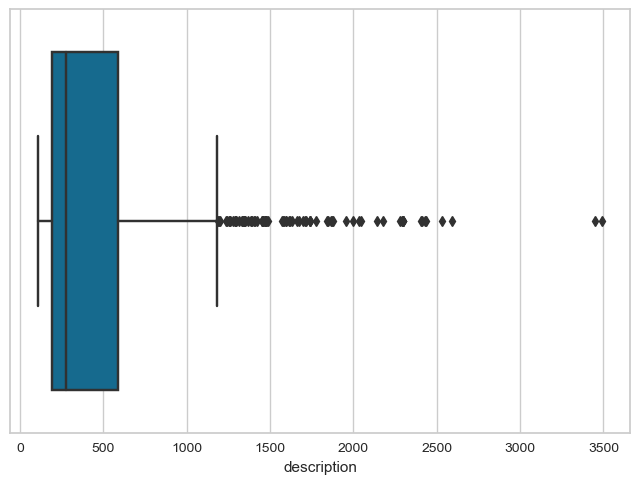

In [23]:
tmp1 = df[col1].str.len()
sns.boxplot(tmp1)

C:\Users\salma\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='product_name'>

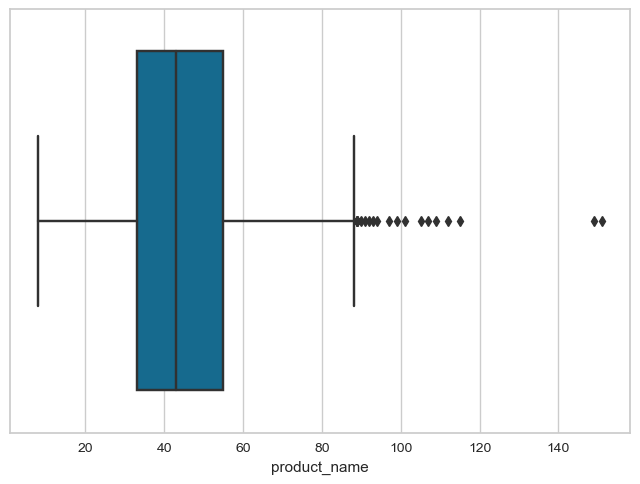

In [24]:
tmp2 = df[col2].str.len()
sns.boxplot(tmp2)

C:\Users\salma\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='concat_description_name'>

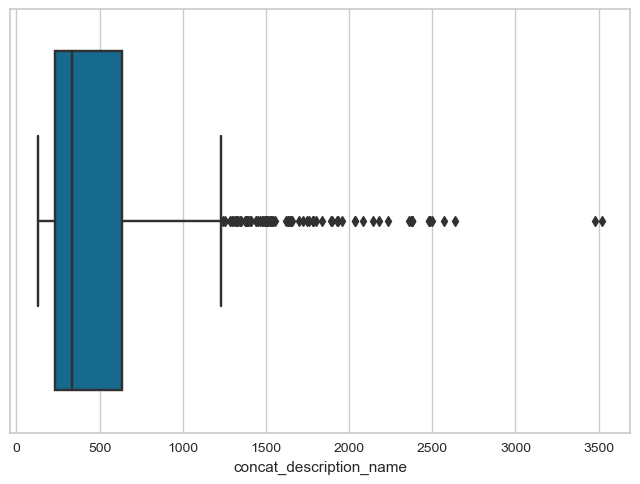

In [25]:
tmp3 = df[col3].str.len()
sns.boxplot(tmp3)

(-0.5, 599.5, 299.5, -0.5)

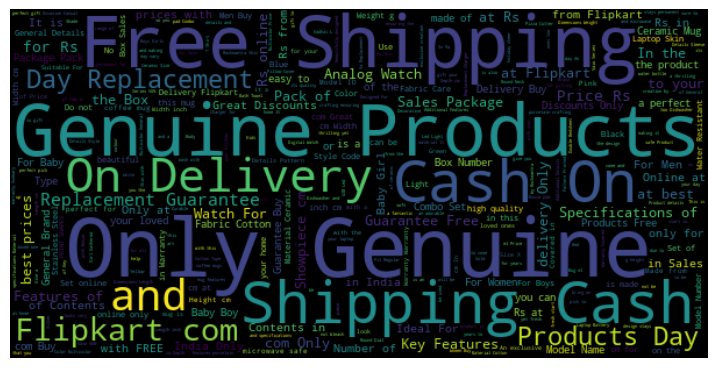

In [26]:
# Le vocabulaire dans le corpus1
wordcloud1 = WordCloud(random_state = 8,
        normalize_plurals = False,
        width = 600, height= 300,
        max_words = 300,
        stopwords = [])
# Apply the wordcloud to the text.
wordcloud1.generate(corpus1)

fig, ax = plt.subplots(1,1, figsize = (9,6))
plt.imshow(wordcloud1, interpolation='bilinear')
plt.axis("off")

(-0.5, 599.5, 299.5, -0.5)

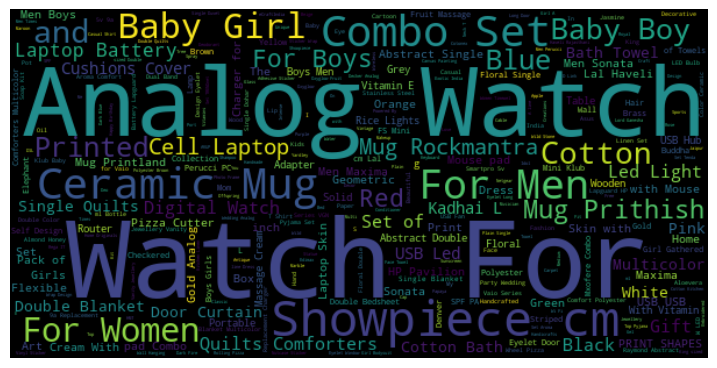

In [27]:
# Le vocabulaire dans le corpus2
wordcloud2 = WordCloud(random_state = 8,
        normalize_plurals = False,
        width = 600, height= 300,
        max_words = 300,
        stopwords = [])
# Apply the wordcloud to the text.
wordcloud2.generate(corpus2)

fig, ax = plt.subplots(1,1, figsize = (9,6))
plt.imshow(wordcloud2, interpolation='bilinear')
plt.axis("off")

(-0.5, 599.5, 299.5, -0.5)

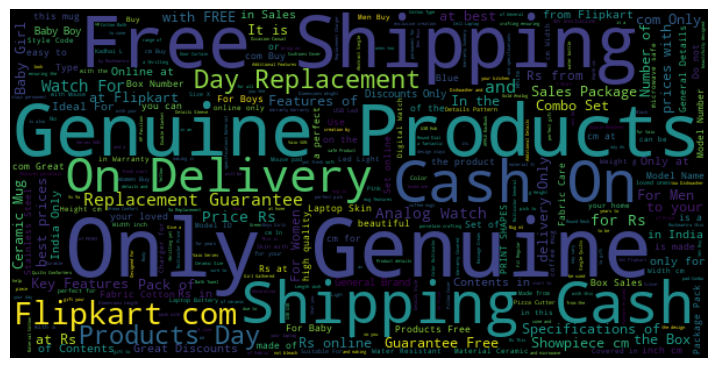

In [28]:
# Le vocabulaire dans le corpus3
wordcloud3 = WordCloud(random_state = 8,
        normalize_plurals = False,
        width = 600, height= 300,
        max_words = 300,
        stopwords = [])
# Apply the wordcloud to the text.
wordcloud3.generate(corpus3)

fig, ax = plt.subplots(1,1, figsize = (9,6))
plt.imshow(wordcloud3, interpolation='bilinear')
plt.axis("off")

### 2- Pré-traitement du corpus

#### (a) Liste des caractères uniques

In [29]:
def unique_caracteres(data, col):
    """Cette fonction affiche la liste des caractères uniques de notre corpus (colonne texte)"""
    
    caracteres = set(data[col].sum())
        
    return caracteres 

In [30]:
caracteres_description  = unique_caracteres(df, col1)
caracteres_nom  = unique_caracteres(df, col2)
caracteres_nom_des  = unique_caracteres(df, col3)

print(f'Les caractères uniques dans le corpus {col1} : {caracteres_description}')
print('-'*20)
print(f'Les caractères uniques dans le corpus {col2} : {caracteres_nom}')
print('-'*20)
print(f'Les caractères uniques dans le corpus {col3} : {caracteres_nom_des}')

Les caractères uniques dans le corpus description : {'F', '_', ' ', '5', '”', '[', 'q', ']', 'B', 'd', 'D', '.', '+', 'G', 'u', '…', 'Q', 'W', 'x', '-', '’', '?', 's', 'U', ')', '±', 'g', '#', 'w', '/', ':', 'h', '°', '@', 'R', '\n', 'X', 'H', '\xa0', '2', 'r', '\t', 'P', 'A', 'M', '(', 'f', '4', 'K', 'y', 't', '6', 'p', 'Y', 'b', ';', '`', '9', '1', '\r', '*', "'", 'o', 'n', 'c', '“', 'e', '•', 'Z', '–', 'j', '|', 'O', 'v', '"', '%', '7', 'i', '&', 'I', '!', 'C', 'V', 'T', 'E', '8', '\u2028', 'J', 'l', '0', 'é', 'a', 'L', '3', 'k', ',', '�', 'N', 'm', 'S', 'z'}
--------------------
Les caractères uniques dans le corpus product_name : {'F', '_', ' ', '5', 'q', 'B', 'd', 'D', '.', '+', 'G', 'u', 'Q', 'W', 'x', '-', '?', 's', 'U', ')', 'g', 'w', '/', ':', 'h', '@', 'R', 'X', 'H', '2', 'r', 'P', 'A', 'M', '(', 'f', '4', 'y', 'K', 't', '6', 'p', 'Y', 'b', '9', '1', "'", 'o', 'n', 'c', 'e', 'Z', 'j', 'O', 'v', '"', '7', '%', 'i', '&', 'I', '!', 'C', 'V', 'T', 'E', '8', 'J', 'l', '0', 'a', '

On remarque qu'on a des lettres majuscules et minuscules, la ponctuation, des espaces et des chiffres. On voit aussi qu'on a des caractères comme '\u2028', '\xa0', etc qui sont dû à l'encodage.

#### (b) Majuscules et espaces

In [31]:
corpus1_nett = corpus1.lower().strip()
corpus2_nett = corpus2.lower().strip()
corpus3_nett = corpus3.lower().strip()

In [32]:
print(f'Le corpus après passage aux minuscules {col1} : {corpus1_nett[:100]}')
print('-'*20)
print(f'Le corpus après passage aux minuscules {col2} : {corpus2_nett[:100]}')
print('-'*20)
print(f'Le corpus après passage aux minuscules {col3} : {corpus3_nett[:100]}')

Le corpus après passage aux minuscules description : key features of elegance polyester multicolor abstract eyelet door curtain floral curtain,elegance p
--------------------
Le corpus après passage aux minuscules product_name : elegance polyester multicolor abstract eyelet door curtain sathiyas cotton bath towel eurospa cotton
--------------------
Le corpus après passage aux minuscules concat_description_name : key features of elegance polyester multicolor abstract eyelet door curtain floral curtain,elegance p


#### (c) Les tokens

In [33]:
tokens1 = word_tokenize(corpus1_nett)
tokens2 = word_tokenize(corpus2_nett)
tokens3 = word_tokenize(corpus3_nett)

In [34]:
def affichage_tokens(tokens, n):
    """on affiche les n tokens uniques du corpus"""
    
    print(f"nb tokens {len(tokens)}, nb tokens uniques {len(set(tokens))}")
    print(tokens[:n])

In [35]:
affichage_tokens(tokens1, 40)
print('-'*100)
affichage_tokens(tokens2, 40)
print('-'*100)
affichage_tokens(tokens3, 40)

nb tokens 91561, nb tokens uniques 6625
['key', 'features', 'of', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtain', ',', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', '(', '213', 'cm', 'in', 'height', ',', 'pack', 'of', '2', ')', 'price', ':', 'rs', '.', '899', 'this', 'curtain', 'enhances', 'the', 'look']
----------------------------------------------------------------------------------------------------
nb tokens 7929, nb tokens uniques 2398
['elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'sathiyas', 'cotton', 'bath', 'towel', 'eurospa', 'cotton', 'terry', 'face', 'towel', 'set', 'santosh', 'royal', 'fashion', 'cotton', 'printed', 'king', 'sized', 'double', 'bedsheet', 'jaipur', 'print', 'cotton', 'floral', 'king', 'sized', 'double', 'bedsheet', 'maserati', 'time', 'r8851116001', 'analog', 'watch', '-']
-----------------------------------------------------------------

#### (d) Stopwords

In [36]:
stop_words = set(stopwords.words('english'))
stop_words

{'a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'ain',
 'all',
 'am',
 'an',
 'and',
 'any',
 'are',
 'aren',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 'couldn',
 "couldn't",
 'd',
 'did',
 'didn',
 "didn't",
 'do',
 'does',
 'doesn',
 "doesn't",
 'doing',
 'don',
 "don't",
 'down',
 'during',
 'each',
 'few',
 'for',
 'from',
 'further',
 'had',
 'hadn',
 "hadn't",
 'has',
 'hasn',
 "hasn't",
 'have',
 'haven',
 "haven't",
 'having',
 'he',
 'her',
 'here',
 'hers',
 'herself',
 'him',
 'himself',
 'his',
 'how',
 'i',
 'if',
 'in',
 'into',
 'is',
 'isn',
 "isn't",
 'it',
 "it's",
 'its',
 'itself',
 'just',
 'll',
 'm',
 'ma',
 'me',
 'mightn',
 "mightn't",
 'more',
 'most',
 'mustn',
 "mustn't",
 'my',
 'myself',
 'needn',
 "needn't",
 'no',
 'nor',
 'not',
 'now',
 'o',
 'of',
 'off',
 'on',
 'once',
 'only',
 'or',
 'other',
 'our',
 'ours',
 'ourselves',
 'out',
 'over',
 'own',
 'r

#### (e) Ponctuation

In [37]:
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [38]:
stop_words = stopwords.words('english')
exclude = set(string.punctuation)
stop_words.extend(exclude)
tokens_vf1 = [word for word in tokens1 if word not in stop_words]
tokens_vf2 = [word for word in tokens2 if word not in stop_words]
tokens_vf3 = [word for word in tokens3 if word not in stop_words]

In [39]:
print('La liste des tokens pour la variable description:', tokens_vf1[:30])
print('-'*20)
print('La liste des tokens pour la variable nom du produit:', tokens_vf2[:30])
print('-'*20)
print('La liste des tokens pour les deux variables concaténées:', tokens_vf3[:30])

La liste des tokens pour la variable description: ['key', 'features', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtain', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', '213', 'cm', 'height', 'pack', '2', 'price', 'rs', '899', 'curtain', 'enhances', 'look', 'interiors.this']
--------------------
La liste des tokens pour la variable nom du produit: ['elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'sathiyas', 'cotton', 'bath', 'towel', 'eurospa', 'cotton', 'terry', 'face', 'towel', 'set', 'santosh', 'royal', 'fashion', 'cotton', 'printed', 'king', 'sized', 'double', 'bedsheet', 'jaipur', 'print', 'cotton', 'floral']
--------------------
La liste des tokens pour les deux variables concaténées: ['key', 'features', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtain', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'doo

On voit bien qu'il reste encore des chiffres à supprimer et des mots tels que 'cm', 'Rs', etc.

#### (f) Les numéros et chiffres

On supprime les nombres

In [40]:
tokens_without_number1 = [i for i in tokens_vf1 if not i.isdigit()]
tokens_without_number2 = [i for i in tokens_vf2 if not i.isdigit()]
tokens_without_number3 = [i for i in tokens_vf3 if not i.isdigit()]

In [41]:
Counter(tokens_without_number1).most_common(20)

[('products', 630),
 ('free', 613),
 ('rs', 592),
 ('buy', 581),
 ('delivery', 567),
 ('genuine', 564),
 ('shipping', 564),
 ('cash', 564),
 ('replacement', 559),
 ('cm', 543),
 ('day', 539),
 ('flipkart.com', 472),
 ('guarantee', 471),
 ('online', 396),
 ('features', 395),
 ('specifications', 370),
 ('price', 352),
 ('watch', 330),
 ('mug', 327),
 ('baby', 320)]

In [42]:
Counter(tokens_without_number2).most_common(30)

[('watch', 150),
 ('set', 134),
 ('analog', 127),
 ('cm', 109),
 ('showpiece', 105),
 ('baby', 94),
 ('combo', 93),
 ("'s", 92),
 ('men', 78),
 ('ceramic', 78),
 ('mug', 76),
 ('usb', 60),
 ('cotton', 55),
 ('women', 55),
 ('girl', 52),
 ('single', 45),
 ('double', 40),
 ('laptop', 38),
 ('abstract', 37),
 ('boys', 35),
 ('boy', 33),
 ('blue', 32),
 ('led', 31),
 ('multicolor', 29),
 ('printed', 29),
 ('floral', 27),
 ('design', 27),
 ('black', 26),
 ('prithish', 26),
 ('blanket', 26)]

In [43]:
Counter(tokens_without_number3).most_common(30)

[('cm', 652),
 ('products', 632),
 ('free', 617),
 ('rs', 592),
 ('buy', 582),
 ('replacement', 568),
 ('delivery', 567),
 ('genuine', 564),
 ('shipping', 564),
 ('cash', 564),
 ('day', 542),
 ('watch', 480),
 ('flipkart.com', 472),
 ('guarantee', 471),
 ('set', 441),
 ('baby', 414),
 ("'s", 409),
 ('mug', 403),
 ('online', 396),
 ('features', 395),
 ('analog', 382),
 ('specifications', 370),
 ('price', 352),
 ('cotton', 351),
 ('color', 333),
 ('pack', 329),
 ('showpiece', 311),
 ('material', 309),
 ('type', 303),
 ('box', 303)]

#### (g) Lemmatisation et stemmation

In [44]:
lemmatizer = WordNetLemmatizer()
lemma_description = [lemmatizer.lemmatize(w) for w in tokens_without_number1]
lemma_name = [lemmatizer.lemmatize(w) for w in tokens_without_number2]
lemma_name_des = [lemmatizer.lemmatize(w) for w in tokens_without_number3]

print('La liste des tokens pour la variable description après lemmatisation:', lemma_description[:100])
print('-'*20)
print('La liste des tokens pour la variable nom du produit après lemmatisation:', lemma_name[:100])
print('-'*20)
print('La liste des tokens pour la variable nom du produit après lemmatisation:', lemma_name_des[:100])

La liste des tokens pour la variable description après lemmatisation: ['key', 'feature', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtain', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'cm', 'height', 'pack', 'price', 'r', 'curtain', 'enhances', 'look', 'interiors.this', 'curtain', 'made', 'high', 'quality', 'polyester', 'fabric.it', 'feature', 'eyelet', 'style', 'stitch', 'metal', 'ring.it', 'make', 'room', 'environment', 'romantic', 'loving.this', 'curtain', 'ant-', 'wrinkle', 'anti', 'shrinkage', 'elegant', 'apparance.give', 'home', 'bright', 'modernistic', 'appeal', 'design', 'surreal', 'attention', 'sure', 'steal', 'heart', 'contemporary', 'eyelet', 'valance', 'curtain', 'slide', 'smoothly', 'draw', 'apart', 'first', 'thing', 'morning', 'welcome', 'bright', 'sun', 'ray', 'want', 'wish', 'good', 'morning', 'whole', 'world', 'draw', 'close', 'evening', 'create', 'special', 'moment', 'joyous', 'beaut

In [45]:
stemmer = PorterStemmer()
stem_description = [stemmer.stem(w) for w in tokens_without_number1]
stem_name = [stemmer.stem(w) for w in tokens_without_number2]
stem_name_des = [stemmer.stem(w) for w in tokens_without_number3]

print('La liste des tokens pour la variable description après le stemming:', stem_description[:100])
print('-'*20)
print('La liste des tokens pour la variable nom du produit après le stemming:', stem_name[:100])
print('-'*20)
print('La liste des tokens pour la variable nom du produit après le stemming:', stem_name_des[:100])

La liste des tokens pour la variable description après le stemming: ['key', 'featur', 'eleg', 'polyest', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtain', 'eleg', 'polyest', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'cm', 'height', 'pack', 'price', 'rs', 'curtain', 'enhanc', 'look', 'interiors.thi', 'curtain', 'made', 'high', 'qualiti', 'polyest', 'fabric.it', 'featur', 'eyelet', 'style', 'stitch', 'metal', 'ring.it', 'make', 'room', 'environ', 'romant', 'loving.thi', 'curtain', 'ant-', 'wrinkl', 'anti', 'shrinkag', 'eleg', 'apparance.g', 'home', 'bright', 'modernist', 'appeal', 'design', 'surreal', 'attent', 'sure', 'steal', 'heart', 'contemporari', 'eyelet', 'valanc', 'curtain', 'slide', 'smoothli', 'draw', 'apart', 'first', 'thing', 'morn', 'welcom', 'bright', 'sun', 'ray', 'want', 'wish', 'good', 'morn', 'whole', 'world', 'draw', 'close', 'even', 'creat', 'special', 'moment', 'joyou', 'beauti', 'given', 'sooth', 'print', 'bring', 'home', 'eleg

#### (h) Pos tagging

In [46]:
tokens_tag_description = pos_tag(lemma_description)
tokens_tag_name = pos_tag(lemma_name)
tokens_tag_name_des = pos_tag(lemma_name_des)

In [47]:
print('POS tagging pour le corpus description ;', tokens_tag_description[:100])
print('-------------------')
print('POS tagging pour le corpus name :', tokens_tag_name[:100]) 
print('-------------------')
print('POS tagging pour les deux corpus description et name :', tokens_tag_name_des[:100]) 

POS tagging pour le corpus description ; [('key', 'JJ'), ('feature', 'NN'), ('elegance', 'NN'), ('polyester', 'NN'), ('multicolor', 'NN'), ('abstract', 'JJ'), ('eyelet', 'NN'), ('door', 'NN'), ('curtain', 'VBP'), ('floral', 'JJ'), ('curtain', 'NN'), ('elegance', 'NN'), ('polyester', 'NN'), ('multicolor', 'NN'), ('abstract', 'JJ'), ('eyelet', 'NN'), ('door', 'NN'), ('curtain', 'NN'), ('cm', 'NN'), ('height', 'VBD'), ('pack', 'NN'), ('price', 'NN'), ('r', 'NN'), ('curtain', 'NN'), ('enhances', 'NNS'), ('look', 'VBP'), ('interiors.this', 'JJ'), ('curtain', 'NN'), ('made', 'VBD'), ('high', 'JJ'), ('quality', 'NN'), ('polyester', 'NN'), ('fabric.it', 'JJ'), ('feature', 'NN'), ('eyelet', 'NN'), ('style', 'NN'), ('stitch', 'NN'), ('metal', 'NN'), ('ring.it', 'NNS'), ('make', 'VBP'), ('room', 'NN'), ('environment', 'NN'), ('romantic', 'JJ'), ('loving.this', 'NN'), ('curtain', 'NN'), ('ant-', 'JJ'), ('wrinkle', 'NN'), ('anti', 'JJ'), ('shrinkage', 'NN'), ('elegant', 'JJ'), ('apparance.give', 'J

In [48]:
def recuperate_name(dico, list_val):
    """Cette fonction permet de garder que les types de mots qu'on veut : NN pour noun"""
    l_name = []
    key_list=list(dico.keys())
    val_list=list(dico.values())
    for i in range(len(dico)):
        if val_list[i] in list_val:
            name = key_list[i]
            l_name.append(name)
            
    return l_name

In [49]:
list_val = ['NN','VBP','VB']
res_description = recuperate_name(dict(tokens_tag_description), list_val)
res_name = recuperate_name(dict(tokens_tag_name), list_val)
res_name_des = recuperate_name(dict(tokens_tag_name_des), list_val)

print('Pos tagging pour la variable description :', res_description[:100])
print('-------------------')
print('Pos tagging pour la variable name :', res_name[:100])
print('-------------------')
print('Pos tagging pour la variable name :', res_name_des[:100])

Pos tagging pour la variable description : ['feature', 'elegance', 'polyester', 'multicolor', 'eyelet', 'door', 'curtain', 'cm', 'height', 'pack', 'price', 'r', 'look', 'quality', 'style', 'stitch', 'metal', 'make', 'room', 'environment', 'loving.this', 'shrinkage', 'home', 'appeal', 'design', 'attention', 'heart', 'valance', 'slide', 'draw', 'thing', 'morning', 'welcome', 'sun', 'ray', 'want', 'world', 'create', 'moment', 'beauty', 'print', 'bring', 'get', 'amount', 'specification', 'brand', 'type', 'model', 'name', 'duster25', 'color', 'dimension', 'length', 'box', 'number', 'sale', 'package', 'body', 'material', 'cotton', 'bath', 'towel', 'machine', 'self', 'gsm', 'ideal', 'woman', 'boy', 'girl', 'size', 'mediam', 'inch', 'width', 'eurospa', 'terry', 'face', 'piece', 'export', 'product', 'take', 'care', 'skin', 'give', 'deserve', 'lot', 'year', 'absorbency', 'softness', 'durability', 'note', 'vary', 'picture', '±3', 'wash', 'water', 'iron', 'bleach', 'use', 'cms.', 'santosh']
------

#### (i) Fonction du pré-traitement

On regroupe les différents prétraitements dans une fonction

In [50]:
def preproc(text, pos_tagging=False):
    """Cette fonction renvoie la liste du corpus après prétraitement
    
    arguments
    -------------
    txt : str: le corpus 
    """
    
    list_preproc = []
    
    #corpus = "".join(data[col].values)
    
    # Mettre tout en minuscules
    corpus = text.lower()
    
    # séprarer en mots (tokens)
    words_token = word_tokenize(corpus)
    
    # stop words et ponctuation
    stop_words = stopwords.words('english')
    list_deleted_words = ['r','rs', "'s", 'flipkart.com','key','cm','features']
    stop_words.extend(list_deleted_words)
    exclude = set(string.punctuation)
    stop_words.extend(exclude)
    words_cleaned1 = [word for word in words_token if word not in stop_words]
    
    
    # Suppression des nombres
    words_cleaned2 = [i for i in words_cleaned1 if not i.isdigit()]
    
    # lemmatisation
    lemmatizer = WordNetLemmatizer()
    words_cleaned_f = [lemmatizer.lemmatize(w) for w in words_cleaned2]
    
    # Pos tagging
    if pos_tagging == True :
        list_val = ['NN','VBP','VB']
        tokens_tag = pos_tag(words_cleaned_f)
        pos_tagging_words = recuperate_name(dict(tokens_tag), list_val)
        return ' '.join(pos_tagging_words)
    
    return ' '.join(words_cleaned_f)
     

In [51]:
df['description_cleaned'] = df['description'].apply(lambda word : preproc(word))
df['product_name_cleaned'] = df['product_name'].apply(lambda word : preproc(word))
df['description_name_cleaned'] = df['concat_description_name'].apply(lambda word : preproc(word))
df.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,label_names,concat_description_name,description_cleaned,product_name_cleaned,description_name_cleaned
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Key Features of Elegance Polyester Multicolor ...,elegance polyester multicolor abstract eyelet ...,elegance polyester multicolor abstract eyelet ...,elegance polyester multicolor abstract eyelet ...
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa...",Baby Care,Specifications of Sathiyas Cotton Bath Towel (...,specification sathiyas cotton bath towel bath ...,sathiyas cotton bath towel,specification sathiyas cotton bath towel bath ...
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",...",Baby Care,Key Features of Eurospa Cotton Terry Face Towe...,eurospa cotton terry face towel set size small...,eurospa cotton terry face towel set,eurospa cotton terry face towel set size small...
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Key Features of SANTOSH ROYAL FASHION Cotton P...,santosh royal fashion cotton printed king size...,santosh royal fashion cotton printed king size...,santosh royal fashion cotton printed king size...
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa...",Home Furnishing,Key Features of Jaipur Print Cotton Floral Kin...,jaipur print cotton floral king sized double b...,jaipur print cotton floral king sized double b...,jaipur print cotton floral king sized double b...


## D) Clustering

### 1- Approche "Bag-of-words"

#### (a) TF-IDF (Term frequency-inverse frequency document)

In [52]:
tfvect = TfidfVectorizer(stop_words='english', max_df=0.95, min_df=1)


col1_clean = 'description_cleaned'
col2_clean = 'product_name_cleaned'
col3_clean = 'description_name_cleaned'



# Pour le corpus 'description'
tf_fit1 = tfvect.fit(df[col1_clean])
tf_transform1 = tfvect.transform(df[col1_clean])

# Pour le corpus 'name'
tf_fit2 = tfvect.fit(df[col2_clean])
tf_transform2 = tfvect.transform(df[col2_clean])

# Pour le corpus 'description' + 'name'
tf_fit3 = tfvect.fit(df[col3_clean])
tf_transform3 = tfvect.transform(df[col3_clean])

#### (b) CountVectorizer

In [53]:
cvect = CountVectorizer(stop_words='english', max_df=0.95, min_df=1)

# Pour le corpus 'description'
cv_fit1 = cvect.fit(df[col1_clean])
cv_transform1 = cvect.transform(df[col1_clean])

# Pour le corpus 'name'
cv_fit2 = cvect.fit(df[col2_clean])
cv_transform2 = cvect.transform(df[col2_clean])

# Pour le corpus 'description' + 'name'
cv_fit3 = cvect.fit(df[col3_clean])
cv_transform3 = cvect.transform(df[col3_clean])

In [54]:
l_cat = list(set(df['label_names']))
#print("catégories : ", l_cat)
y_cat_num = [(1-l_cat.index(df.iloc[i]['label_names'])) for i in range(len(df))]

#### (c) Modélisation et graphiques

In [55]:
import time

# Calcul Tsne, détermination des clusters et calcul ARI entre vrais catégorie et n° de clusters
def ARI_fct(features) :
    time1 = time.time()
    num_labels=len(l_cat)
    tsne = TSNE(n_components=2, perplexity=30, n_iter=2000, 
                                 init='random', learning_rate=200, random_state=42)
    X_tsne = tsne.fit_transform(features)
    
    # Détermination des clusters à partir des données après Tsne 
    cls = KMeans(n_clusters=num_labels, n_init=100, random_state=42)
    cls.fit(X_tsne)
    ARI = np.round(adjusted_rand_score(y_cat_num, cls.labels_),4)
    time2 = np.round(time.time() - time1,0)
    print("ARI : ", ARI, "time : ", time2)
    
    return ARI, X_tsne, cls.labels_


# visualisation du Tsne selon les vraies catégories et selon les clusters
def TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI) :
    fig = plt.figure(figsize=(15,6))
    
    ax = fig.add_subplot(121)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=y_cat_num, cmap='Set1')
    ax.legend(handles=scatter.legend_elements()[0], labels=l_cat, loc="best", title="Categorie")
    plt.title('Représentation des produits par catégories réelles')
    
    ax = fig.add_subplot(122)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=labels, cmap='Set1')
    ax.legend(handles=scatter.legend_elements()[0], labels=set(labels), loc="best", title="Clusters")
    plt.title('Représentation des catégories par clusters')
    
    plt.show()
    print("ARI : ", ARI)

#### (d) Résultats

In [56]:
print(f"Pour le corpus {col1_clean}")
print("CountVectorizer : ")
print("-----------------")
ARI_cv1, X_tsne_cv1, labels_cv1 = ARI_fct(cv_transform1)
print()
print("Tf-idf : ")
print("--------")
ARI_tf1, X_tsne_tf1, labels_tf1 = ARI_fct(tf_transform1)

Pour le corpus description_cleaned
CountVectorizer : 
-----------------
ARI :  0.3925 time :  30.0

Tf-idf : 
--------
ARI :  0.5026 time :  24.0


In [57]:
print(f"Pour le corpus {col2_clean}")
print("CountVectorizer : ")
print("-----------------")
ARI_cv2, X_tsne_cv2, labels_cv2 = ARI_fct(cv_transform2)
print()
print("Tf-idf : ")
print("--------")
ARI_tf2, X_tsne_tf2, labels_tf2 = ARI_fct(tf_transform2)

Pour le corpus product_name_cleaned
CountVectorizer : 
-----------------
ARI :  0.3903 time :  24.0

Tf-idf : 
--------
ARI :  0.4314 time :  25.0


In [58]:
print(f"Pour le corpus {col3_clean}")
print("CountVectorizer : ")
print("-----------------")
ARI_cv3, X_tsne_cv3, labels_cv3 = ARI_fct(cv_transform3)
print()
print("Tf-idf : ")
print("--------")
ARI_tf3, X_tsne_tf3, labels_tf3 = ARI_fct(tf_transform3)

Pour le corpus description_name_cleaned
CountVectorizer : 
-----------------
ARI :  0.4251 time :  23.0

Tf-idf : 
--------
ARI :  0.5867 time :  26.0


### Visualisation des topics avec LDA (corpus description)

In [59]:
n_topics = 20

# Créer le modèle LDA
lda = LatentDirichletAllocation(
        n_components=n_topics, 
        max_iter=5, 
        learning_method='online', 
        learning_offset=50.,
        random_state=0)

# Fitter et transformer sur les données
lda_top=lda.fit_transform(cv_transform1)

In [60]:
vocab = cvect.get_feature_names()
for i, comp in enumerate(lda.components_):
    vocab_comp = zip(vocab, comp)
    sorted_words = sorted(vocab_comp, key= lambda x:x[1], reverse=True)[:10]
    print("Topic "+str(i)+": ")
    for t in sorted_words:
        print(t[1],end=" ")
        print("n")

Topic 0: 
43.45157694555524 n
39.887836372592865 n
24.425932238859254 n
24.205862586593742 n
21.7442828366065 n
20.50481007403858 n
20.496155497536527 n
18.658309160736522 n
17.849487748215637 n
17.63058428385899 n
Topic 1: 
57.84551490415154 n
48.23902991157427 n
44.17860035003986 n
40.01163126453098 n
33.88865121962837 n
33.153431894208666 n
32.52198382222688 n
26.788355966931046 n
26.186561816749442 n
24.667407507898588 n
Topic 2: 
26.015000593783206 n
13.224174928070525 n
10.323993142369737 n
8.077464906665403 n
7.338529974517635 n
6.655748210924966 n
6.363296425107039 n
5.936046321408577 n
5.781987917642142 n
5.779085081681255 n
Topic 3: 
335.18881764726956 n
160.39305672532421 n
119.83611793318981 n
109.4574177732352 n
91.29295669497905 n
73.9526802118872 n
60.75783309163539 n
56.837651114514 n
52.99142023672167 n
52.5361950024596 n
Topic 4: 
7.600197721873806 n
5.140413989710954 n
5.084372036105494 n
4.5982815262377095 n
3.6233104707864126 n
3.4422804830268747 n
3.14104763869954

C:\Users\salma\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



#### (e) Graphiques

**Pour le corpus 'description'**

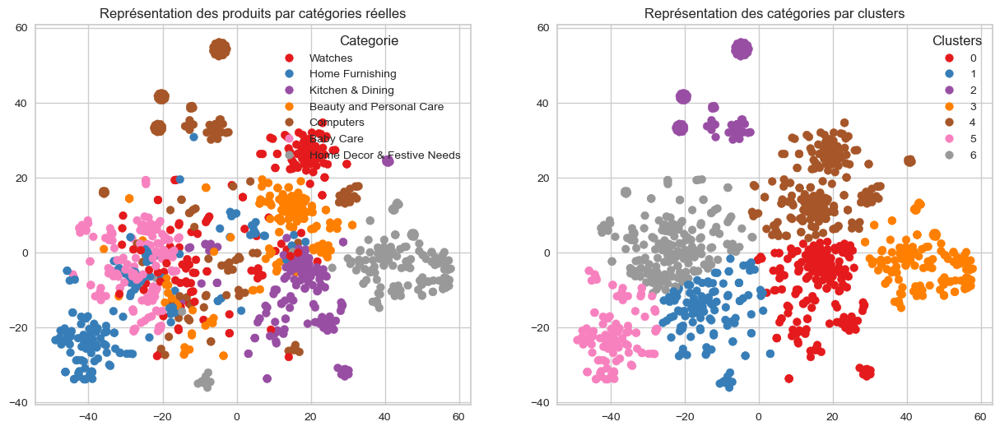

ARI :  0.3925


In [61]:
# Avec CountVectorizer 
TSNE_visu_fct(X_tsne_cv1, y_cat_num, labels_cv1, ARI_cv1)

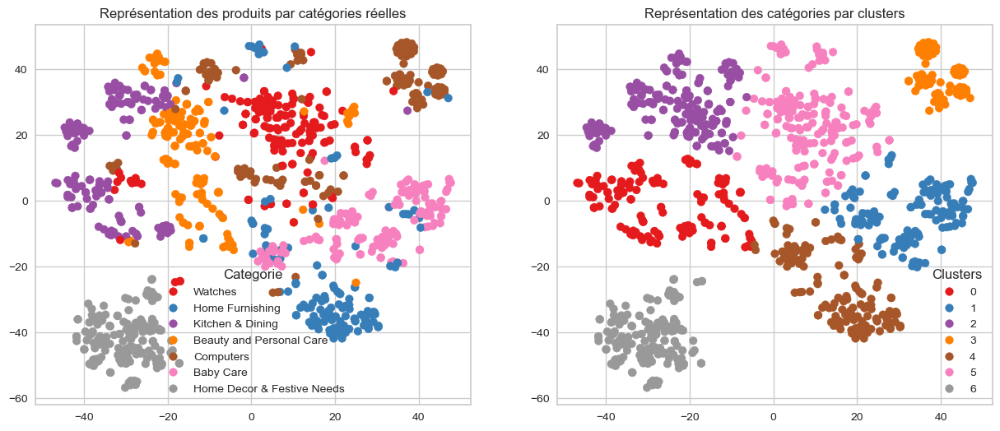

ARI :  0.5026


In [62]:
# Avec TF-idf 
TSNE_visu_fct(X_tsne_tf1, y_cat_num, labels_tf1, ARI_tf1)

**Pour le corpus 'name_product'**

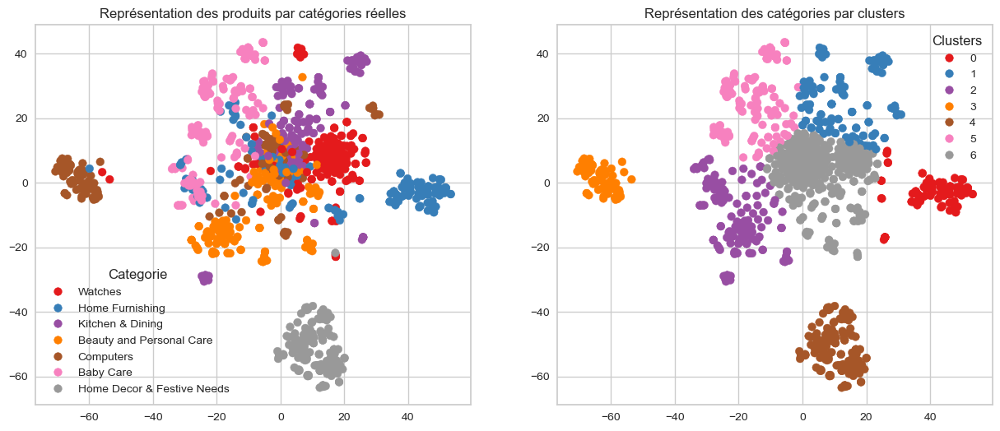

ARI :  0.3903


In [63]:
# Avec CountVectorizer 
TSNE_visu_fct(X_tsne_cv2, y_cat_num, labels_cv2, ARI_cv2)

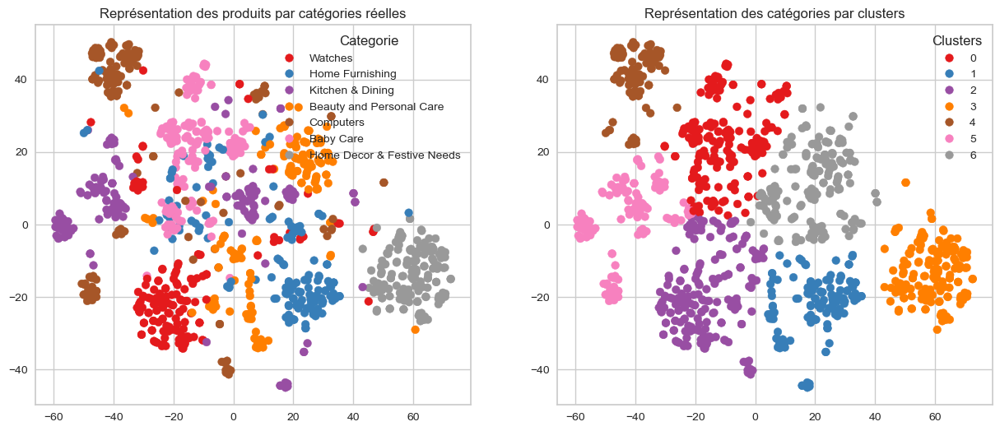

ARI :  0.4314


In [64]:
# Avec TF-idf 
TSNE_visu_fct(X_tsne_tf2, y_cat_num, labels_tf2, ARI_tf2)

**Pour le corpus 'description' + 'name'**

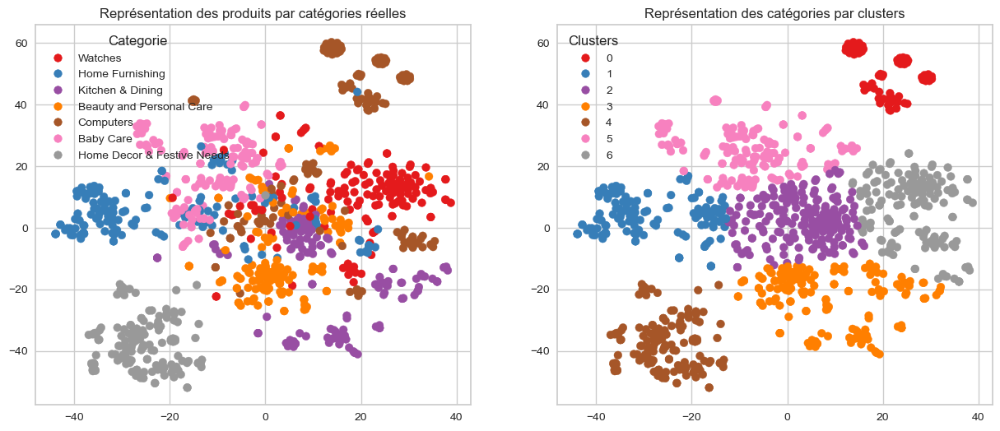

ARI :  0.4251


In [65]:
# Avec CountVectorizer 
TSNE_visu_fct(X_tsne_cv3, y_cat_num, labels_cv3, ARI_cv3)

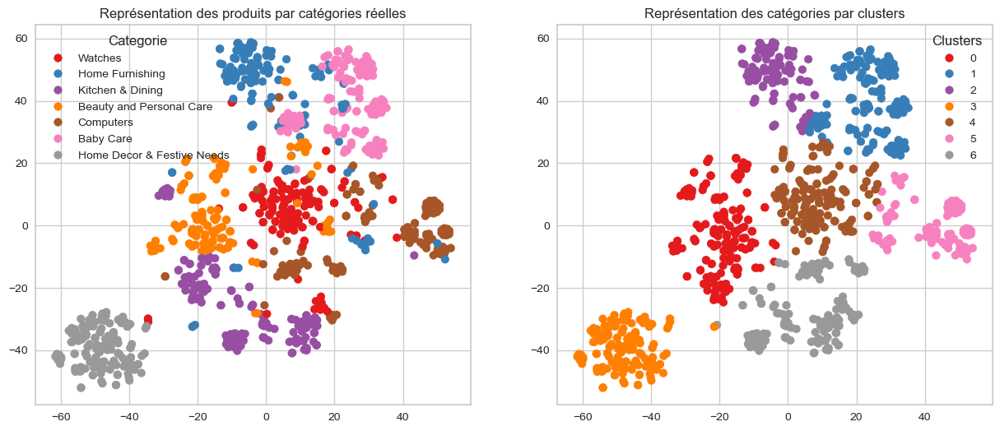

ARI :  0.5867


In [66]:
# Avec TF-idf 
TSNE_visu_fct(X_tsne_tf3, y_cat_num, labels_tf3, ARI_tf3)

### 4- Approche de type word/sentence embedding

#### (a) Modèle Word2Vec

**Création du modèle**

In [67]:
w2v_size=300
w2v_window=5
w2v_min_count=1
w2v_epochs=100
maxlen = 100 # adapt to length of sentences

In [68]:
def model_word2vec(w2v_size, w2v_window, w2v_min_count, w2v_epochs, maxlen, col):
    sentences = df[col].to_list()
    sentences = [gensim.utils.simple_preprocess(text) for text in sentences]
    
    # Création et entraînement du modèle Word2Vec
    print("Build & train Word2Vec model ...")
    w2v_model = gensim.models.Word2Vec(min_count=w2v_min_count, window=w2v_window,
                                       vector_size=w2v_size,
                                       seed=42,workers=1)
    #workers=multiprocessing.cpu_count())
    w2v_model.build_vocab(sentences)
    w2v_model.train(sentences, total_examples=w2v_model.corpus_count, epochs=w2v_epochs)
    model_vectors = w2v_model.wv
    w2v_words = model_vectors.index_to_key
    print("Vocabulary size: %i" % len(w2v_words))
    print("Word2Vec trained")
    
    # Préparation des sentences (tokenization)

    print("Fit Tokenizer ...")
    tokenizer = Tokenizer()
    tokenizer.fit_on_texts(sentences)
    x_sentences = pad_sequences(tokenizer.texts_to_sequences(sentences),
                                                         maxlen=maxlen,
                                                         padding='post') 

    num_words = len(tokenizer.word_index) + 1
    print("Number of unique words: %i" % num_words)
    
    # Création de la matrice d'embedding
    print("Create Embedding matrix ...")
    w2v_size = 300
    word_index = tokenizer.word_index
    vocab_size = len(word_index) + 1
    embedding_matrix = np.zeros((vocab_size, w2v_size))
    i=0
    j=0

    for word, idx in word_index.items():
        i +=1
        if word in w2v_words:
            j +=1
            embedding_vector = model_vectors[word]
            if embedding_vector is not None:
                embedding_matrix[idx] = model_vectors[word]

    word_rate = np.round(j/i,4)
    print("Word embedding rate : ", word_rate)
    print("Embedding matrix: %s" % str(embedding_matrix.shape))  
    
    # Création du modèle d'embedding
    input=Input(shape=(len(x_sentences),maxlen),dtype='float64')
    word_input=Input(shape=(maxlen,),dtype='float64')  
    word_embedding=Embedding(input_dim=vocab_size,
                             output_dim=w2v_size,
                             weights = [embedding_matrix],
                             input_length=maxlen)(word_input)
    word_vec=GlobalAveragePooling1D()(word_embedding)  
    embed_model = Model([word_input],word_vec)

    embed_model.summary()
    
    # Exécution du modèle
    embeddings = embed_model.predict(x_sentences)
    ARI, X_tsne, labels = ARI_fct(embeddings)
    
    return ARI, X_tsne, labels

In [69]:
# Pour le corpus 'description'
ARI_embedding1, X_tsne_embedding1, labels_embedding1 = model_word2vec(w2v_size, w2v_window, w2v_min_count, w2v_epochs, maxlen, col1_clean)

Build & train Word2Vec model ...
Vocabulary size: 4728
Word2Vec trained
Fit Tokenizer ...
Number of unique words: 4729
Create Embedding matrix ...
Word embedding rate :  1.0
Embedding matrix: (4729, 300)
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 100)]             0         
                                                                 
 embedding (Embedding)       (None, 100, 300)          1418700   
                                                                 
 global_average_pooling1d (G  (None, 300)              0         
 lobalAveragePooling1D)                                          
                                                                 
Total params: 1,418,700
Trainable params: 1,418,700
Non-trainable params: 0
_________________________________________________________________
33/33 [==============================] - 0s 3

In [70]:
# Pour le corpus 'name_product'
ARI_embedding2, X_tsne_embedding2, labels_embedding2 = model_word2vec(w2v_size, w2v_window, w2v_min_count, w2v_epochs, maxlen, col2_clean)

Build & train Word2Vec model ...
Vocabulary size: 1956
Word2Vec trained
Fit Tokenizer ...
Number of unique words: 1957
Create Embedding matrix ...
Word embedding rate :  1.0
Embedding matrix: (1957, 300)
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 100)]             0         
                                                                 
 embedding_1 (Embedding)     (None, 100, 300)          587100    
                                                                 
 global_average_pooling1d_1   (None, 300)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 587,100
Trainable params: 587,100
Non-trainable params: 0
_________________________________________________________________
33/33 [==============================] - 0s 3ms

In [71]:
# Pour le corpus 'description' + 'name_procuct'
ARI_embedding3, X_tsne_embedding3, labels_embedding3 = model_word2vec(w2v_size, w2v_window, w2v_min_count, w2v_epochs, maxlen, col3_clean)

Build & train Word2Vec model ...
Vocabulary size: 4728
Word2Vec trained
Fit Tokenizer ...
Number of unique words: 4729
Create Embedding matrix ...
Word embedding rate :  1.0
Embedding matrix: (4729, 300)
Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 100)]             0         
                                                                 
 embedding_2 (Embedding)     (None, 100, 300)          1418700   
                                                                 
 global_average_pooling1d_2   (None, 300)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 1,418,700
Trainable params: 1,418,700
Non-trainable params: 0
_________________________________________________________________
33/33 [==============================] - 0s

**Graphiques**

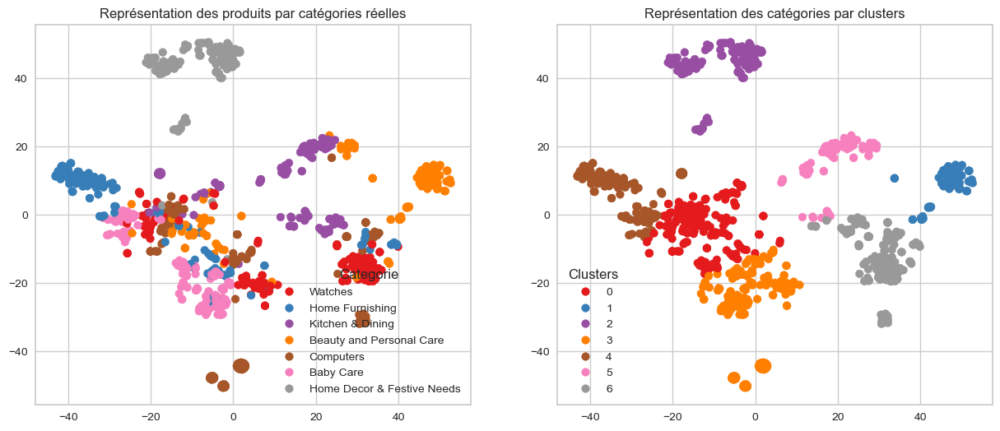

ARI :  0.3534


In [72]:
TSNE_visu_fct(X_tsne_embedding1, y_cat_num, labels_embedding1, ARI_embedding1)

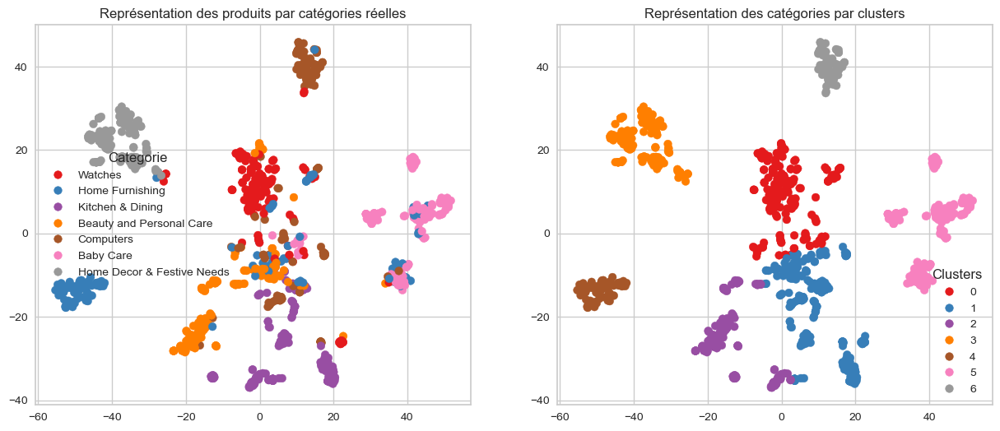

ARI :  0.5161


In [73]:
TSNE_visu_fct(X_tsne_embedding2, y_cat_num, labels_embedding2, ARI_embedding2)

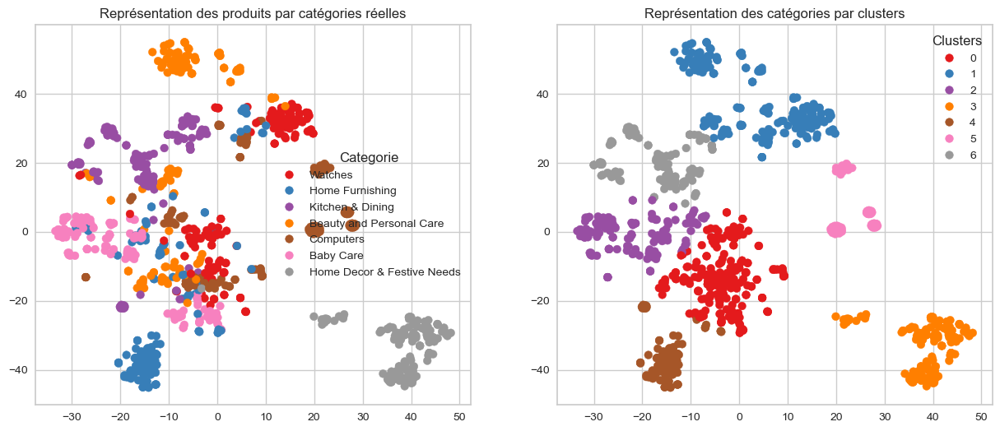

ARI :  0.3966


In [74]:
TSNE_visu_fct(X_tsne_embedding3, y_cat_num, labels_embedding3, ARI_embedding3)

### 5- BERT

#### (a) Fonctions communes

In [75]:
# Fonction de préparation des sentences
def bert_inp_fct(sentences, bert_tokenizer, max_length) :
    input_ids=[]
    token_type_ids = []
    attention_mask=[]
    bert_inp_tot = []

    for sent in sentences:
        bert_inp = bert_tokenizer.encode_plus(sent,
                                              add_special_tokens = True,
                                              max_length = max_length,
                                              padding='max_length',
                                              return_attention_mask = True, 
                                              return_token_type_ids=True,
                                              truncation=True,
                                              return_tensors="tf")
    
        input_ids.append(bert_inp['input_ids'][0])
        token_type_ids.append(bert_inp['token_type_ids'][0])
        attention_mask.append(bert_inp['attention_mask'][0])
        bert_inp_tot.append((bert_inp['input_ids'][0], 
                             bert_inp['token_type_ids'][0], 
                             bert_inp['attention_mask'][0]))

    input_ids = np.asarray(input_ids)
    token_type_ids = np.asarray(token_type_ids)
    attention_mask = np.array(attention_mask)
    
    return input_ids, token_type_ids, attention_mask, bert_inp_tot
    

# Fonction de création des features
def feature_BERT_fct(model, model_type, sentences, max_length, b_size, mode='HF') :
    batch_size = b_size
    batch_size_pred = b_size
    bert_tokenizer = AutoTokenizer.from_pretrained(model_type)
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        input_ids, token_type_ids, attention_mask, bert_inp_tot = bert_inp_fct(sentences[idx:idx+batch_size], 
                                                                      bert_tokenizer, max_length)
        
        if mode=='HF' :    # Bert HuggingFace
            outputs = model.predict([input_ids, attention_mask, token_type_ids], batch_size=batch_size_pred)
            last_hidden_states = outputs.last_hidden_state

        if mode=='TFhub' : # Bert Tensorflow Hub
            text_preprocessed = {"input_word_ids" : input_ids, 
                                 "input_mask" : attention_mask, 
                                 "input_type_ids" : token_type_ids}
            outputs = model(text_preprocessed)
            last_hidden_states = outputs['sequence_output']
             
        if step ==0 :
            last_hidden_states_tot = last_hidden_states
            last_hidden_states_tot_0 = last_hidden_states
        else :
            last_hidden_states_tot = np.concatenate((last_hidden_states_tot,last_hidden_states))
    
    features_bert = np.array(last_hidden_states_tot).mean(axis=1)
    
    time2 = np.round(time.time() - time1,0)
    print("temps traitement : ", time2)
     
    return features_bert, last_hidden_states_tot

In [76]:
max_length = 64
batch_size = 10
model_type = 'bert-base-uncased'

In [77]:
def tokenizer_fct(sentence) :
    # print(sentence)
    sentence_clean = sentence.replace('-', ' ').replace('+', ' ').replace('/', ' ').replace('#', ' ')
    word_tokens = word_tokenize(sentence_clean)
    return word_tokens

# Stop words
from nltk.corpus import stopwords
stop_w = list(set(stopwords.words('english'))) + ['[', ']', ',', '.', ':', '?', '(', ')']

def stop_word_filter_fct(list_words) :
    filtered_w = [w for w in list_words if not w in stop_w]
    filtered_w2 = [w for w in filtered_w if len(w) > 2]
    return filtered_w2

# lower case et alpha
def lower_start_fct(list_words) :
    lw = [w.lower() for w in list_words if (not w.startswith("@")) 
    #                                   and (not w.startswith("#"))
                                       and (not w.startswith("http"))]
    return lw

In [78]:
sentences1 = df['description_cleaned'].to_list()
sentences2 = df['product_name_cleaned'].to_list()
sentences3 = df['description_name_cleaned'].to_list()

#### (b) BERT hub Tensorflow

In [79]:
import tensorflow_hub as hub
from transformers import TFAutoModel, AutoTokenizer

In [80]:

#import tensorflow_text 

# Guide sur le Tensorflow hub : https://www.tensorflow.org/text/tutorials/classify_text_with_bert
model_url = 'https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4'
bert_layer = hub.KerasLayer(model_url, trainable=True)

In [81]:

model = bert_layer

features_bert1, last_hidden_states_tot1 = feature_BERT_fct(model, model_type, sentences1, 
                                                         max_length, batch_size, mode='TFhub')

features_bert2, last_hidden_states_tot2 = feature_BERT_fct(model, model_type, sentences2, 
                                                         max_length, batch_size, mode='TFhub')

features_bert3, last_hidden_states_tot3 = feature_BERT_fct(model, model_type, sentences3, 
                                                         max_length, batch_size, mode='TFhub')

temps traitement :  296.0
temps traitement :  340.0
temps traitement :  299.0


In [82]:
ARI_bert1, X_tsne_bert1, labels_bert1 = ARI_fct(features_bert1)

ARI :  0.3493 time :  25.0


In [83]:
ARI_bert2, X_tsne_bert2, labels_bert2 = ARI_fct(features_bert2)

ARI :  0.5797 time :  26.0


In [84]:
ARI_bert3, X_tsne_bert3, labels_bert3 = ARI_fct(features_bert3)

ARI :  0.3862 time :  25.0


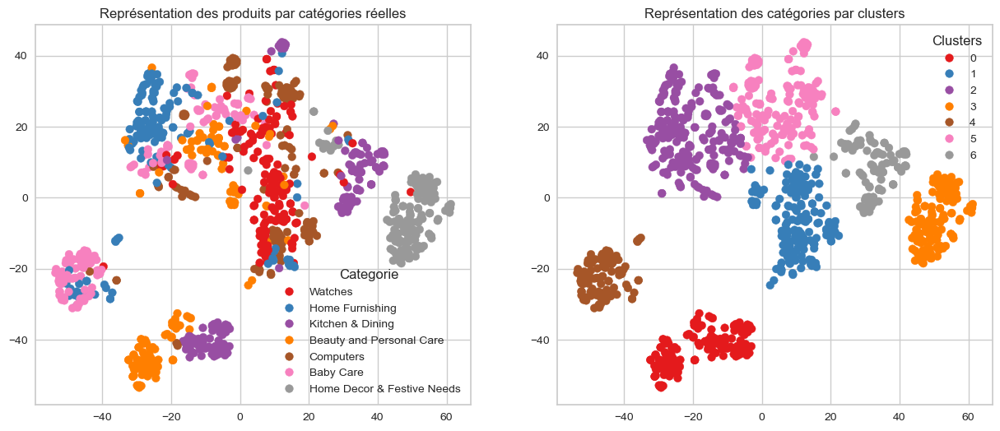

ARI :  0.3493


In [85]:
TSNE_visu_fct(X_tsne_bert1, y_cat_num, labels_bert1, ARI_bert1)

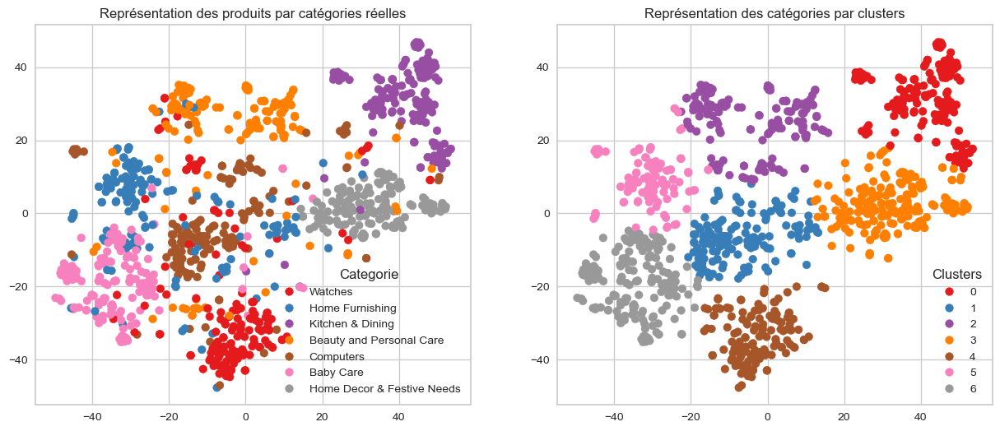

ARI :  0.5797


In [86]:
TSNE_visu_fct(X_tsne_bert2, y_cat_num, labels_bert2, ARI_bert2)

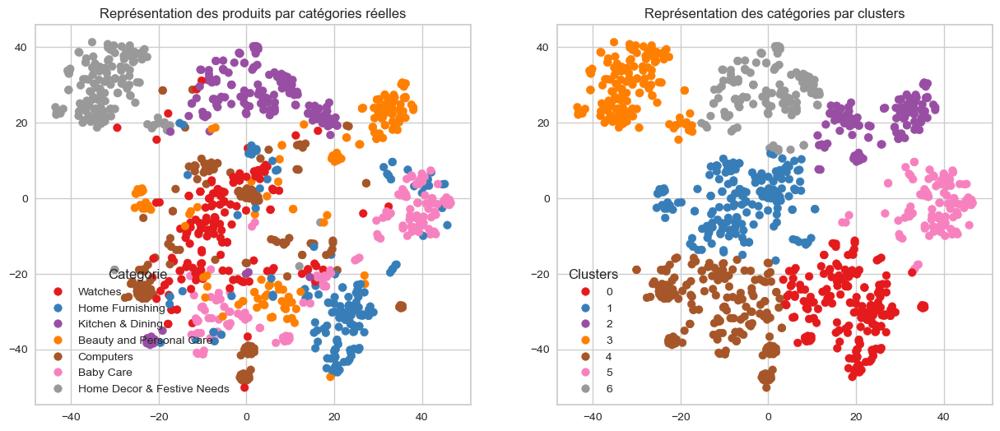

ARI :  0.3862


In [87]:
TSNE_visu_fct(X_tsne_bert3, y_cat_num, labels_bert3, ARI_bert3)

### 6- USE : Universal Sentence Encoder

In [88]:
import tensorflow_hub as hub
embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

In [89]:
def feature_USE_fct(sentences, b_size) :
    batch_size = b_size
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        feat = embed(sentences[idx:idx+batch_size])

        if step ==0 :
            features = feat
        else :
            features = np.concatenate((features,feat))

    time2 = np.round(time.time() - time1,0)
    return features

In [90]:
batch_size = 10

In [91]:
features_USE1 = feature_USE_fct(sentences1, batch_size)
features_USE2 = feature_USE_fct(sentences2, batch_size)
features_USE3 = feature_USE_fct(sentences3, batch_size)

ARI_USE1, X_tsne_USE1, labels_USE1 = ARI_fct(features_USE1)
print('-'*30)
ARI_USE2, X_tsne_USE2, labels_USE2 = ARI_fct(features_USE2)
print('-'*30)
ARI_USE3, X_tsne_USE3, labels_USE3 = ARI_fct(features_USE3)

ARI :  0.3822 time :  25.0
------------------------------
ARI :  0.6147 time :  25.0
------------------------------
ARI :  0.504 time :  24.0


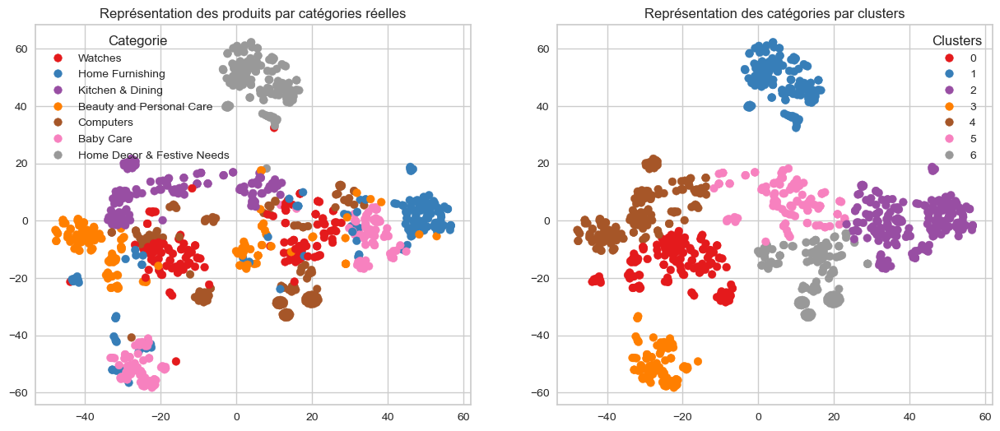

ARI :  0.3822


In [92]:
TSNE_visu_fct(X_tsne_USE1, y_cat_num, labels_USE1, ARI_USE1)

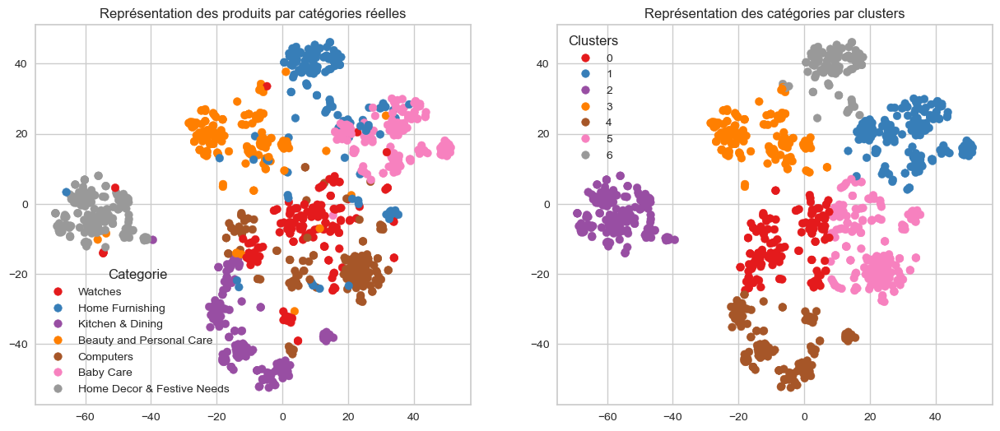

ARI :  0.6147


In [93]:
TSNE_visu_fct(X_tsne_USE2, y_cat_num, labels_USE2, ARI_USE2)

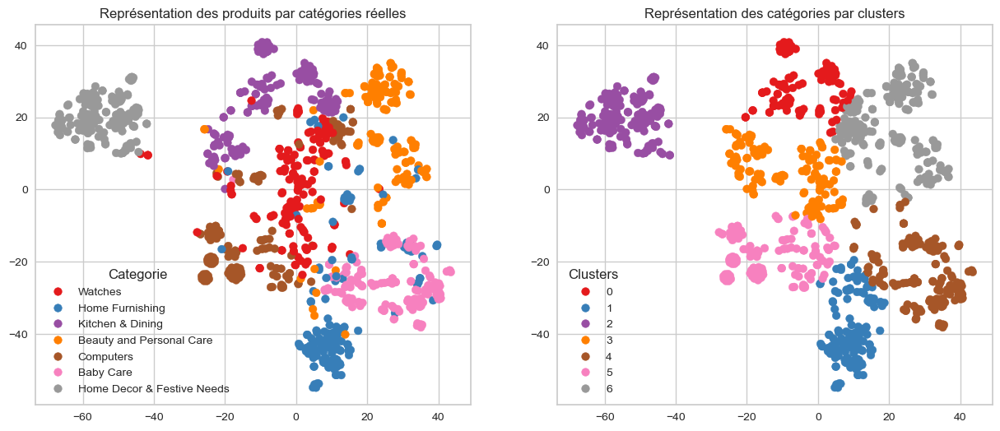

ARI :  0.504


In [94]:
TSNE_visu_fct(X_tsne_USE3, y_cat_num, labels_USE3, ARI_USE3)

### 7- Comparaison

In [95]:
df_comparaison = pd.DataFrame(columns=['name_model', 'ARI_description','ARI_name_product', 'ARI_concat'])
l_model = ['CountVectorizer', 'Tf-Idf', 'Word2Vec', 'Bert','Use']
l_ari1 = [ARI_cv1, ARI_tf1, ARI_embedding1, ARI_bert1, ARI_USE1]
l_ari2 = [ARI_cv2, ARI_tf2, ARI_embedding2, ARI_bert2, ARI_USE2]
l_ari3 = [ARI_cv3, ARI_tf3, ARI_embedding3, ARI_bert3, ARI_USE3]
df_comparaison['name_model'] = l_model
df_comparaison['ARI_description'] = l_ari1
df_comparaison['ARI_name_product'] = l_ari2
df_comparaison['ARI_concat'] = l_ari3
df_comparaison.head()

,name_model,ARI_description,ARI_name_product,ARI_concat
0,CountVectorizer,0.3925,0.3903,0.4251
1,Tf-Idf,0.5026,0.4314,0.5867
2,Word2Vec,0.3534,0.5161,0.3966
3,Bert,0.3493,0.5797,0.3862
4,Use,0.3822,0.6147,0.5040


## II- Partie Image

## A- SIFT

In [98]:
from matplotlib.image import imread

path = "C:/Users/salma/OneDrive/Bureau/Projet 6/Data/Flipkart/Images/"

def list_fct(df, name) :
    list_image_name = [list_photos[i] for i in range(len(df)) if df["label_names"][i]==name]
    return list_image_name


list_photos = df['image'].tolist()
le = LabelEncoder()
df["label"] = le.fit_transform(df["label_names"])
df.head()

list_classe1=list_fct(df,"Home Furnishing")
list_classe2=list_fct(df,"Baby Care")
list_classe3=list_fct(df,"Watches")
list_classe4=list_fct(df,"Home Decor & Festive Needs")
list_classe5=list_fct(df,"Kitchen & Dining")
list_classe6=list_fct(df,"Beauty and Personal Care")
list_classe7=list_fct(df,"Computers")
list_labels =df['label_names'].unique().tolist()

Home Furnishing


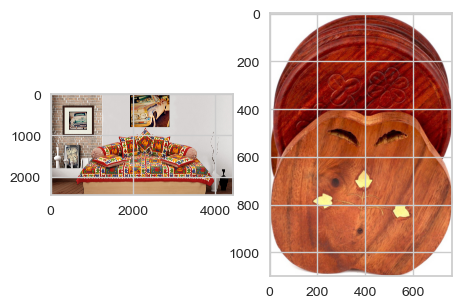

Baby Care


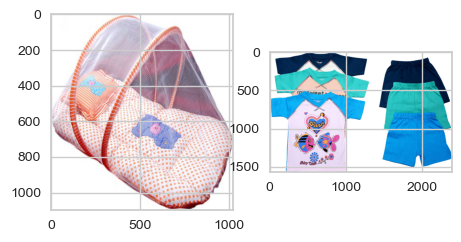

Watches


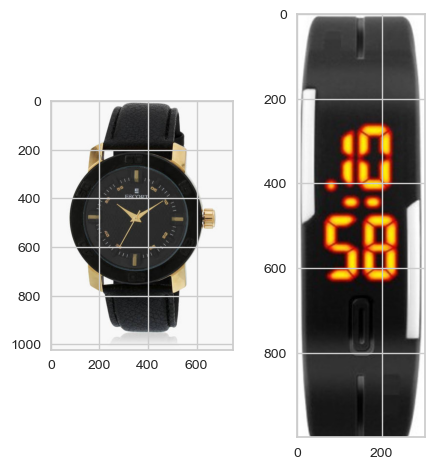

Home Decor & Festive Needs


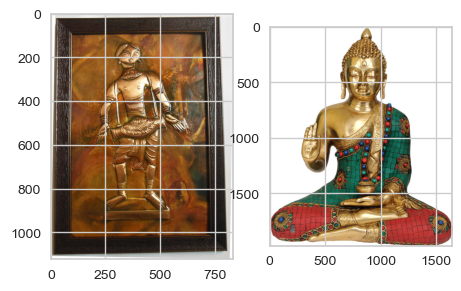

Kitchen & Dining


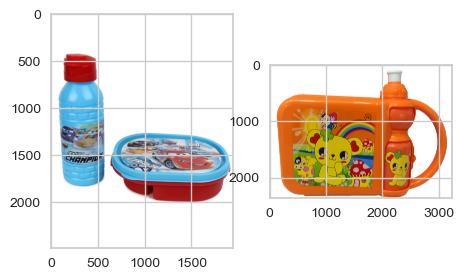

Beauty and Personal Care


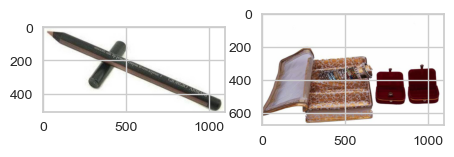

Computers


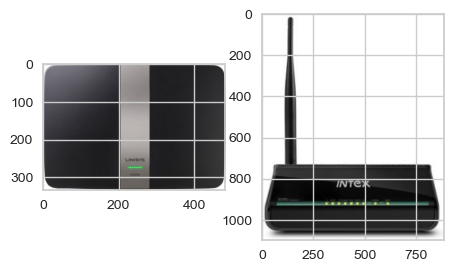

In [99]:
# affichage de 2 images par catégories
for name in list_labels :
    print(name)
    # print("-------")
    for i in range(2):
        plt.subplot(130 + 1 + i)
        filename = path + list_fct(df, name)[i+10]
        image = imread(filename)
        plt.imshow(image)
    plt.show()

### 1- Détermination et affichage des descripteurs SIFT

#### (a) Pour une image 

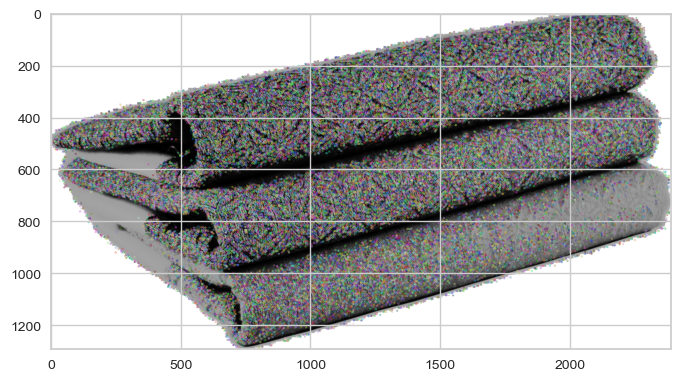

Descripteurs :  (47651, 128)

[[ 85. 113.  31. ...   0.   0.   0.]
 [ 29.  80.  73. ...   0.   0.   0.]
 [ 10.  67. 115. ...   0.   0.  22.]
 ...
 [  0.   0.   0. ...   0.   0.  13.]
 [ 40.   0.   0. ...   0.   0.  51.]
 [ 37.   1.   0. ...   0.   0.   0.]]


In [100]:
sift = cv2.SIFT_create()
image = cv2.imread(path+list_photos[1],0) # convert in gray
image = cv2.equalizeHist(image)   # equalize image histogram
kp, des = sift.detectAndCompute(image, None)
img=cv2.drawKeypoints(image,kp,image)
plt.imshow(img)
plt.show()
print("Descripteurs : ", des.shape)
print()
print(des)

### 2- Pré-traitement des images via SIFT

In [101]:
def preprocess_sift(list_photos, path):
    # identification of key points and associated descriptors
    sift_keypoints = []
    temps1=time.time()
    sift = cv2.SIFT_create(500)

    for image_num in range(len(list_photos)) :
        if image_num%100 == 0 : print(image_num)
        im = cv2.imread(path+list_photos[image_num],0) # convert in gray
        #img = cv2.cvtColor(im,cv2.COLOR_BGR2GRAY)
        res = cv2.equalizeHist(im)   # equalize image histogram
        kp, des = sift.detectAndCompute(res, None)
        sift_keypoints.append(des)


    sift_keypoints_by_img = np.asarray(sift_keypoints)
    sift_keypoints_all    = np.concatenate(sift_keypoints_by_img, axis=0)

    print()
    print("Nombre de descripteurs : ", sift_keypoints_all.shape)

    duration1=time.time()-temps1
    print("temps de traitement SIFT descriptor : ", "%15.2f" % duration1, "secondes")
    
    return sift_keypoints_by_img, sift_keypoints_all

In [102]:
path = "C:/Users/salma/OneDrive/Bureau/Projet 6/Data/Flipkart/Images/"
sift_keypoints_by_img, sift_keypoints_all = preprocess_sift(list_photos, path)

0
100
200
300
400
500
600
700
800
900
1000


C:\Users\salma\AppData\Local\Temp\ipykernel_89300\4013194340.py:16: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.




Nombre de descripteurs :  (517351, 128)
temps de traitement SIFT descriptor :          1013.80 secondes


### 3- Création des clusters de descripteurs

In [103]:
from sklearn import cluster, metrics

# Determination number of clusters
temps1=time.time()

k = int(round(np.sqrt(len(sift_keypoints_all)),0))
print("Nombre de clusters estimés : ", k)
print("Création de",k, "clusters de descripteurs ...")

# Clustering
kmeans = cluster.MiniBatchKMeans(n_clusters=k, init_size=3*k, random_state=0)
kmeans.fit(sift_keypoints_all)

duration1=time.time()-temps1
print("temps de traitement kmeans : ", "%15.2f" % duration1, "secondes")

Nombre de clusters estimés :  719
Création de 719 clusters de descripteurs ...


C:\Users\salma\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning:

MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4



temps de traitement kmeans :            21.50 secondes


### 4- Création des features des images

In [104]:
# Creation of histograms (features)
temps1=time.time()

def build_histogram(kmeans, des, image_num):
    res = kmeans.predict(des)
    hist = np.zeros(len(kmeans.cluster_centers_))
    nb_des=len(des)
    if nb_des==0 : print("problème histogramme image  : ", image_num)
    for i in res:
        hist[i] += 1.0/nb_des
    return hist


# Creation of a matrix of histograms
hist_vectors=[]

for i, image_desc in enumerate(sift_keypoints_by_img) :
    if i%100 == 0 : print(i)  
    hist = build_histogram(kmeans, image_desc, i) #calculates the histogram
    hist_vectors.append(hist) #histogram is the feature vector

im_features = np.asarray(hist_vectors)

duration1=time.time()-temps1
print("temps de création histogrammes : ", "%15.2f" % duration1, "secondes")

0
100
200
300
400
500
600
700
800
900
1000
temps de création histogrammes :           106.14 secondes


### 5- Réductions de dimension

#### (a) Réduction de dimension PCA

In [105]:
from sklearn import manifold, decomposition

print("Dimensions dataset avant réduction PCA : ", im_features.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca= pca.fit_transform(im_features)
print("Dimensions dataset après réduction PCA : ", feat_pca.shape)

Dimensions dataset avant réduction PCA :  (1050, 719)
Dimensions dataset après réduction PCA :  (1050, 498)


#### (b) Réduction de dimension T-SNE

In [106]:
from sklearn import manifold, decomposition

tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
X_tsne = tsne.fit_transform(feat_pca)

df_tsne = pd.DataFrame(X_tsne[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne["class"] = df["label_names"]
print(df_tsne.shape)

C:\Users\salma\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



(1050, 3)


**Analyse visuelle : affichage T-SNE selon catégories d'images**

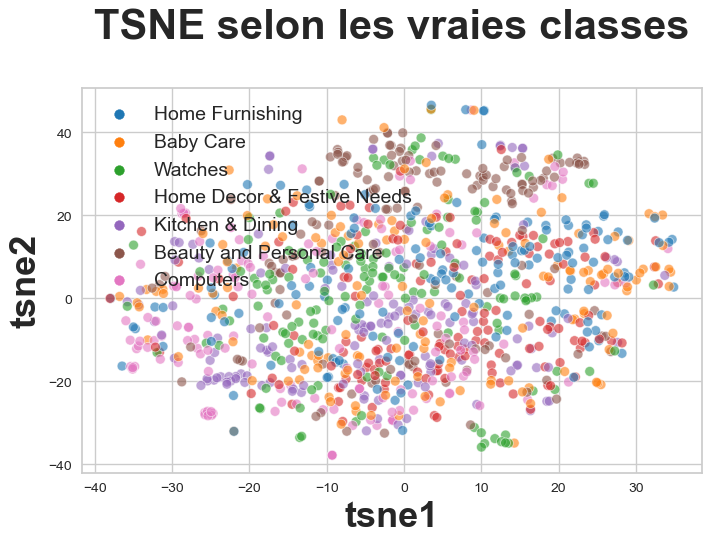

In [107]:
plt.figure(figsize=(8,5))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6)

plt.title('TSNE selon les vraies classes', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

**Analyse mesures : similarité entre catégories et clusters**

(1050, 4)


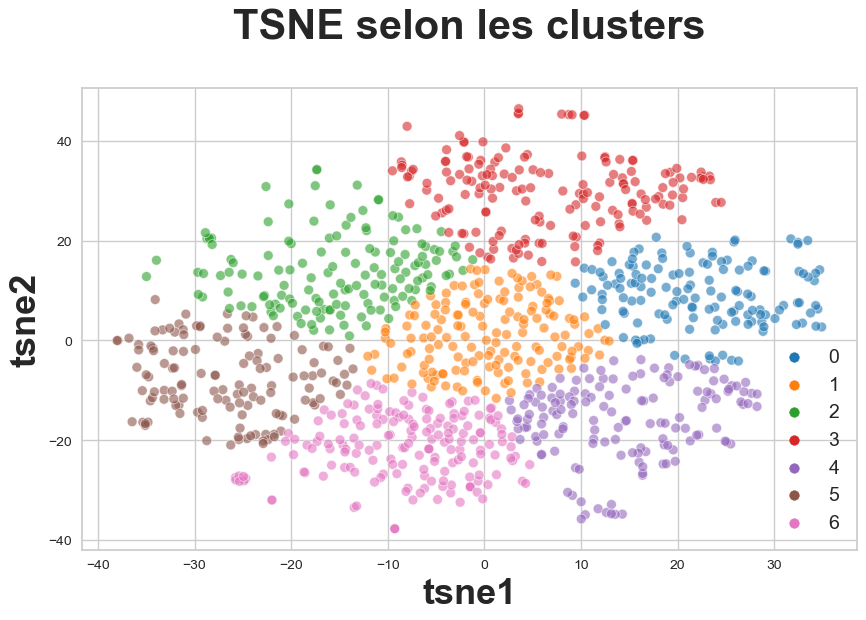

ARI :  0.05866626363017651


In [108]:
# Création de clusters à partir du T-SNE
from sklearn import cluster, metrics

cls = cluster.KMeans(n_clusters=7, random_state=6)
cls.fit(X_tsne)

df_tsne["cluster"] = cls.labels_
print(df_tsne.shape)

#Affichage des images selon clusters et calcul ARI de similarité catégories images / clusters
plt.figure(figsize=(10,6))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6,
    data=df_tsne,
    legend="brief")

plt.title('TSNE selon les clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

labels = df["label"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))

## D) CNN Transfer learning 

### 1- Prétraitement d'images

In [109]:
from tensorflow.keras.preprocessing import image

In [110]:
def preprocess_vgg(list_photos, model):
    
    temps1=time.time()
    list_features = []
    
    for image_num in range(len(list_photos)) :
        if image_num%100 == 0 : print(image_num)
        img = image.load_img(path+list_photos[image_num], target_size=(224,224))
        x = image.img_to_array(img)
        x = np.expand_dims(x, axis=0)
        x = preprocess_input(x)
        features = model.predict(x)
        features_array = np.array(features)
        list_features.append(features_array.flatten())
        
    duration1=time.time()-temps1
    print("Temps d'exécution :", duration1)
    return np.array(list_features)

In [111]:
# load model
model = VGG16(weights="imagenet", input_shape=(224, 224, 3))
# remove the output layer
model = Model(inputs=model.inputs, outputs=model.layers[-2].output)

In [112]:
features_vgg = preprocess_vgg(list_photos, model)
print(features_vgg.shape)

0
1/1 [==============================] - 0s 416ms/step
100
1/1 [==============================] - 0s 384ms/step


1/1 [==============================] - 0s 348ms/step
200
1/1 [==============================] - 0s 399ms/step
300
1/1 [==============================] - 0s 424ms/step


1/1 [==============================] - 0s 485ms/step
400
1/1 [==============================] - 0s 473ms/step


1/1 [==============================] - 0s 437ms/step
500
1/1 [==============================] - 1s 523ms/step
600
1/1 [==============================] - 0s 461ms/step


1/1 [==============================] - 0s 325ms/step


C:\Users\salma\anaconda3\lib\site-packages\PIL\Image.py:3035: DecompressionBombWarning:

Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.



1/1 [==============================] - 0s 273ms/step
700
1/1 [==============================] - 0s 356ms/step
800
1/1 [==============================] - 1s 565ms/step


1/1 [==============================] - 0s 396ms/step
900
1/1 [==============================] - 0s 334ms/step


1/1 [==============================] - 0s 354ms/step
1000
1/1 [==============================] - 0s 400ms/step
Temps d'exécution : 668.647970199585
(1050, 4096)


In [113]:
dump(features_vgg, open('features_vgg_vf.pkl', 'wb'))

In [114]:
features_vgg_vf = pickle.load(open('features_vgg_vf.pkl', 'rb')) 

In [115]:
print("Dimensions dataset avant réduction PCA : ", features_vgg_vf.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca_vgg= pca.fit_transform(features_vgg_vf)
print("Dimensions dataset après réduction PCA : ", feat_pca_vgg.shape)


tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
X_tsne_vgg = tsne.fit_transform(feat_pca_vgg)

df_tsne_vgg = pd.DataFrame(X_tsne_vgg[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne_vgg["class"] = df["label_names"]
print(df_tsne_vgg.shape)


Dimensions dataset avant réduction PCA :  (1050, 4096)
Dimensions dataset après réduction PCA :  (1050, 803)


C:\Users\salma\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



(1050, 3)


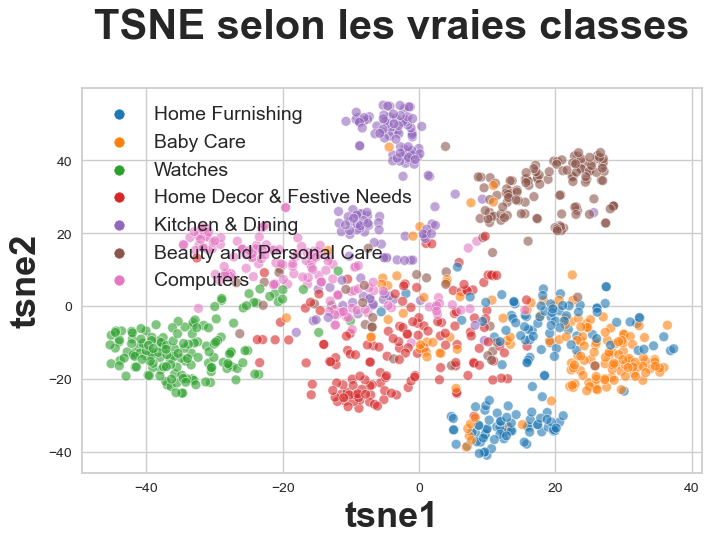

In [116]:
plt.figure(figsize=(8,5))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_vgg, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6)

plt.title('TSNE selon les vraies classes', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

(1050, 4)


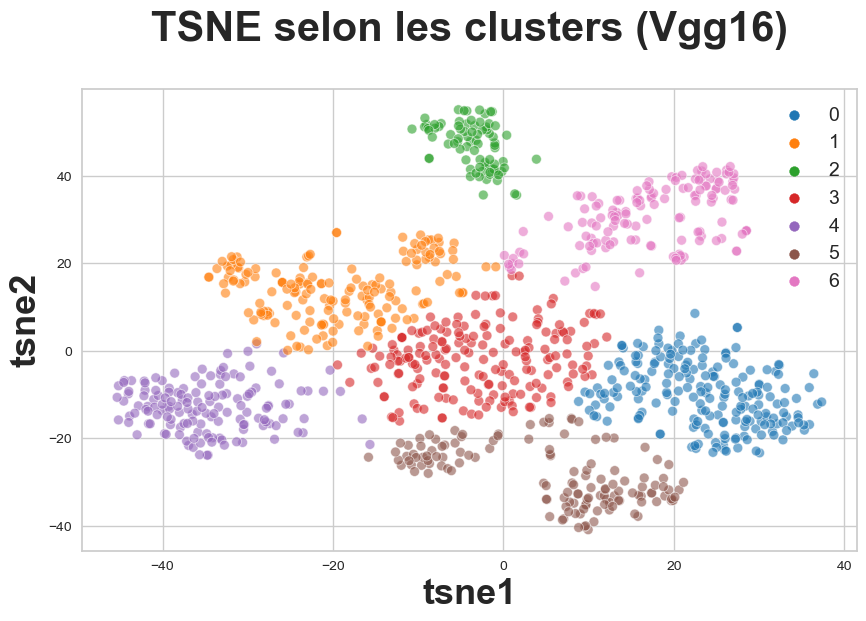

In [117]:
from sklearn import cluster, metrics

cls_vgg = cluster.KMeans(n_clusters=7, random_state=6)
cls_vgg.fit(X_tsne_vgg)

df_tsne_vgg["cluster"] = cls_vgg.labels_
print(df_tsne_vgg.shape)


plt.figure(figsize=(10,6))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6,
    data=df_tsne_vgg,
    legend="brief")

plt.title('TSNE selon les clusters (Vgg16)', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()



In [118]:
labels = df["label"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls_vgg.labels_))

ARI :  0.4393891900971274


## III- Concaténation des résultats images + texte avec les meilleurs modèles

In [120]:
df_mod = df[['uniq_id','product_url', 'product_name', 'image','description','label_names','concat_description_name','label']]



df_mod['features_bert'] = [features_bert2[i] for i in range(df_mod.shape[0])]
df_mod['features_USE'] = [features_USE2[i] for i in range(df_mod.shape[0])]
df_mod['features_vgg16'] = [features_vgg_vf[i] for i in range(df_mod.shape[0])]
df_mod.head()

C:\Users\salma\AppData\Local\Temp\ipykernel_89300\326890431.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\salma\AppData\Local\Temp\ipykernel_89300\326890431.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\salma\AppData\Local\Temp\ipykernel_89300\326890431.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-d

,uniq_id,product_url,product_name,image,description,label_names,concat_description_name,label,features_bert,features_USE,features_vgg16
0,55b85ea15a1536d46b7190ad6fff8ce7,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,Home Furnishing,Key Features of Elegance Polyester Multicolor ...,4,"[-0.06955556, -0.26506263, 0.18769865, 0.03783...","[0.056464557, -0.016699042, -0.03708612, 0.043...","[3.3986154, 0.8595728, 0.0, 1.106561, 2.266123..."
1,7b72c92c2f6c40268628ec5f14c6d590,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,7b72c92c2f6c40268628ec5f14c6d590.jpg,Specifications of Sathiyas Cotton Bath Towel (...,Baby Care,Specifications of Sathiyas Cotton Bath Towel (...,0,"[0.19517803, -0.10087428, -0.00074825773, 0.23...","[0.0059940005, 0.054335315, -0.008692359, 0.02...","[0.0, 0.0, 0.0, 1.1720085, 0.0, 0.0, 0.0, 0.0,..."
2,64d5d4a258243731dc7bbb1eef49ad74,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,64d5d4a258243731dc7bbb1eef49ad74.jpg,Key Features of Eurospa Cotton Terry Face Towe...,Baby Care,Key Features of Eurospa Cotton Terry Face Towe...,0,"[0.17550911, -0.32450035, 0.02523534, 0.254767...","[0.025070908, 0.0025915625, -0.0042600953, 0.0...","[0.0, 0.0, 0.0, 4.4578037, 0.0, 0.0, 0.0, 0.0,..."
3,d4684dcdc759dd9cdf41504698d737d8,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,d4684dcdc759dd9cdf41504698d737d8.jpg,Key Features of SANTOSH ROYAL FASHION Cotton P...,Home Furnishing,Key Features of SANTOSH ROYAL FASHION Cotton P...,4,"[0.22626655, -0.30520627, 0.45082593, 0.106354...","[-0.05697004, -0.03616643, 0.026729846, 0.0552...","[0.0, 0.070991576, 0.0, 2.0462813, 0.0, 0.0, 0..."
4,6325b6870c54cd47be6ebfbffa620ec7,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,6325b6870c54cd47be6ebfbffa620ec7.jpg,Key Features of Jaipur Print Cotton Floral Kin...,Home Furnishing,Key Features of Jaipur Print Cotton Floral Kin...,4,"[0.14696199, -0.31694555, 0.2743688, 0.0664004...","[-0.02260255, -0.025289435, 0.010708151, -0.00...","[3.4171548, 0.0, 0.0, 0.0, 1.0123597, 0.0, 0.0..."


In [121]:
df_mod['concat_bert_vgg'] = df_mod[['features_bert', 'features_vgg16']].apply(lambda x:  np.concatenate((x[0], x[1])), axis=1)
df_mod['concat_use_vgg'] = df_mod[['features_USE', 'features_vgg16']].apply(lambda x:  np.concatenate((x[0], x[1])), axis=1)
df_mod.head()

C:\Users\salma\AppData\Local\Temp\ipykernel_89300\1785792438.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\salma\AppData\Local\Temp\ipykernel_89300\1785792438.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,uniq_id,product_url,product_name,image,description,label_names,concat_description_name,label,features_bert,features_USE,features_vgg16,concat_bert_vgg,concat_use_vgg
0,55b85ea15a1536d46b7190ad6fff8ce7,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,Home Furnishing,Key Features of Elegance Polyester Multicolor ...,4,"[-0.06955556, -0.26506263, 0.18769865, 0.03783...","[0.056464557, -0.016699042, -0.03708612, 0.043...","[3.3986154, 0.8595728, 0.0, 1.106561, 2.266123...","[-0.06955556, -0.26506263, 0.18769865, 0.03783...","[0.056464557, -0.016699042, -0.03708612, 0.043..."
1,7b72c92c2f6c40268628ec5f14c6d590,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,7b72c92c2f6c40268628ec5f14c6d590.jpg,Specifications of Sathiyas Cotton Bath Towel (...,Baby Care,Specifications of Sathiyas Cotton Bath Towel (...,0,"[0.19517803, -0.10087428, -0.00074825773, 0.23...","[0.0059940005, 0.054335315, -0.008692359, 0.02...","[0.0, 0.0, 0.0, 1.1720085, 0.0, 0.0, 0.0, 0.0,...","[0.19517803, -0.10087428, -0.00074825773, 0.23...","[0.0059940005, 0.054335315, -0.008692359, 0.02..."
2,64d5d4a258243731dc7bbb1eef49ad74,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,64d5d4a258243731dc7bbb1eef49ad74.jpg,Key Features of Eurospa Cotton Terry Face Towe...,Baby Care,Key Features of Eurospa Cotton Terry Face Towe...,0,"[0.17550911, -0.32450035, 0.02523534, 0.254767...","[0.025070908, 0.0025915625, -0.0042600953, 0.0...","[0.0, 0.0, 0.0, 4.4578037, 0.0, 0.0, 0.0, 0.0,...","[0.17550911, -0.32450035, 0.02523534, 0.254767...","[0.025070908, 0.0025915625, -0.0042600953, 0.0..."
3,d4684dcdc759dd9cdf41504698d737d8,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,d4684dcdc759dd9cdf41504698d737d8.jpg,Key Features of SANTOSH ROYAL FASHION Cotton P...,Home Furnishing,Key Features of SANTOSH ROYAL FASHION Cotton P...,4,"[0.22626655, -0.30520627, 0.45082593, 0.106354...","[-0.05697004, -0.03616643, 0.026729846, 0.0552...","[0.0, 0.070991576, 0.0, 2.0462813, 0.0, 0.0, 0...","[0.22626655, -0.30520627, 0.45082593, 0.106354...","[-0.05697004, -0.03616643, 0.026729846, 0.0552..."
4,6325b6870c54cd47be6ebfbffa620ec7,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,6325b6870c54cd47be6ebfbffa620ec7.jpg,Key Features of Jaipur Print Cotton Floral Kin...,Home Furnishing,Key Features of Jaipur Print Cotton Floral Kin...,4,"[0.14696199, -0.31694555, 0.2743688, 0.0664004...","[-0.02260255, -0.025289435, 0.010708151, -0.00...","[3.4171548, 0.0, 0.0, 0.0, 1.0123597, 0.0, 0.0...","[0.14696199, -0.31694555, 0.2743688, 0.0664004...","[-0.02260255, -0.025289435, 0.010708151, -0.00..."


In [122]:
features_comb1 = np.array(df_mod['concat_bert_vgg'].tolist())
features_comb2 = np.array(df_mod['concat_use_vgg'].tolist())
features_comb2.shape

(1050, 4608)

In [123]:
print("Dimensions dataset avant réduction PCA : ", features_comb2.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca_comb= pca.fit_transform(features_comb2)
print("Dimensions dataset après réduction PCA : ", feat_pca_comb.shape)


tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
X_tsne_comb = tsne.fit_transform(feat_pca_comb)

df_tsne_comb = pd.DataFrame(X_tsne_comb[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne_comb["class"] = df_mod["label_names"]
print(df_tsne_comb.shape)

Dimensions dataset avant réduction PCA :  (1050, 4608)
Dimensions dataset après réduction PCA :  (1050, 803)


C:\Users\salma\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



(1050, 3)


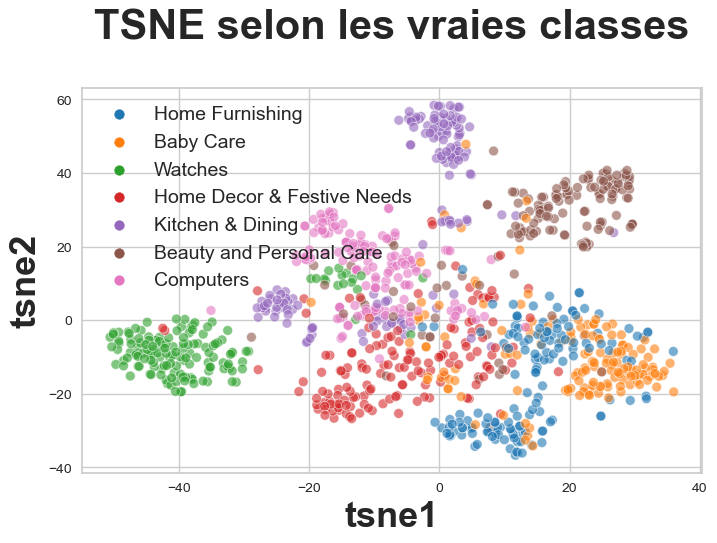

In [124]:
plt.figure(figsize=(8,5))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_comb, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6)

plt.title('TSNE selon les vraies classes', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

(1050, 4)


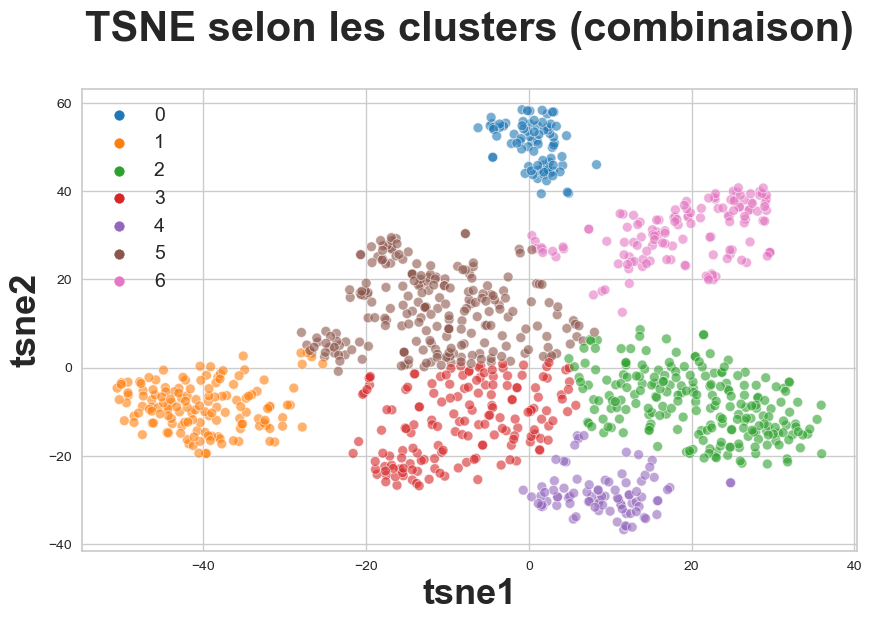

ARI :  0.48454273008902443


In [125]:
from sklearn import cluster, metrics

cls_comb = cluster.KMeans(n_clusters=7, random_state=6)
cls_comb.fit(X_tsne_comb)

df_tsne_comb["cluster"] = cls_comb.labels_
print(df_tsne_comb.shape)


plt.figure(figsize=(10,6))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6,
    data=df_tsne_comb,
    legend="brief")

plt.title('TSNE selon les clusters (combinaison)', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

labels = df_mod["label"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls_comb.labels_))